# Image Quilting

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import os
from random import random
import time

# modify to where you store your project data including utils.py
datadir = "/content/drive/My Drive/ImageQuilting/"


### Part I: Randomly Sampled Texture

I create a function quilt_random that randomly samples square patches of size patch_size from sample in order to create an output image of size output_size.

In [ ]:
import random

def quilt_random(sample, out_size, patch_size):
    """
    Randomly samples square patches of size patchsize from sample in order to create an output image of size outsize.

    :param sample: numpy.ndarray   The image you read from sample directory
    :param out_size: int            The width of the square output image
    :param patch_size: int          The width of the square sample patch
    :return: numpy.ndarray
    """

    output = np.zeros((out_size, out_size, 3))

    for i in range(0, out_size, patch_size):
      for j in range(0, out_size, patch_size):
        x = random.randrange(0, sample.shape[0] - patch_size+1)
        y = random.randrange(0, sample.shape[1] - patch_size+1)
        di = min(i + patch_size, out_size) - i
        dj = min(j + patch_size, out_size) - j
        patch = sample[x : x+patch_size, y : y+patch_size]
        output[i : i+di, j : j+dj] = patch[0: di, 0 : dj]

        # plt.imshow(output)
        # plt.show()

    return output


texture shape :  (192, 192, 3)
texture image : 


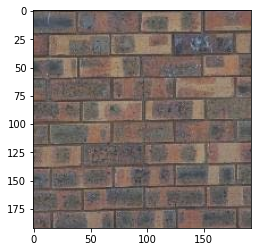


Randomly Sampled Texture image shape :  (400, 400, 3)
Randomly Sampled Texture image : 


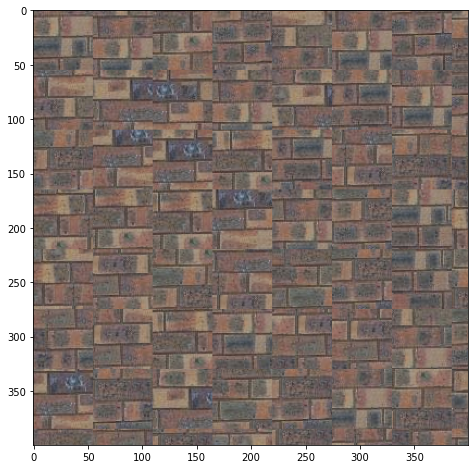

In [ ]:
sample_img_fn = datadir+'samples/bricks_small.jpg' # feel free to change
sample_img = cv2.cvtColor(cv2.imread(sample_img_fn), cv2.COLOR_BGR2RGB)
print("texture shape : ", sample_img.shape)
print("texture image : ")
plt.imshow(sample_img)
plt.show()

print()
out_size = 400
patch_size = 55
res = quilt_random(sample_img, out_size, patch_size)
if res is not None:
  print("Randomly Sampled Texture image shape : ", res.shape)
  print("Randomly Sampled Texture image : ")
  plt.figure(figsize=(8,8))
  plt.imshow(res/255)
  plt.show()


texture shape :  (200, 200, 3)
texture image : 


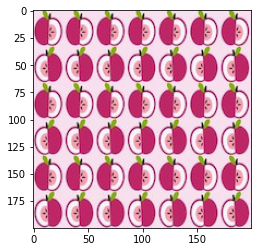


Randomly Sampled Texture image shape :  (300, 300, 3)
Randomly Sampled Texture image : 


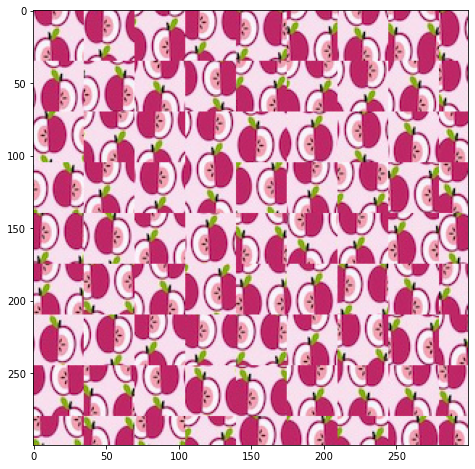

In [ ]:
sample_img_fn = datadir+'samples/apples2.jpeg'
sample_img = cv2.cvtColor(cv2.imread(sample_img_fn), cv2.COLOR_BGR2RGB)
print("texture shape : ", sample_img.shape)
print("texture image : ")
plt.imshow(sample_img)
plt.show()

print()
out_size = 300
patch_size = 35
res = quilt_random(sample_img, out_size, patch_size)
if res is not None:
  print("Randomly Sampled Texture image shape : ", res.shape)
  print("Randomly Sampled Texture image : ")
  plt.figure(figsize=(8,8))
  plt.imshow(res/255)
  plt.show()

texture shape :  (64, 64, 3)
texture image : 


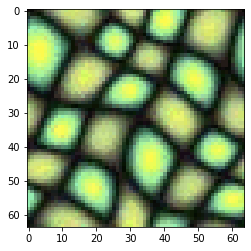


Randomly Sampled Texture image shape :  (300, 300, 3)
Randomly Sampled Texture image : 


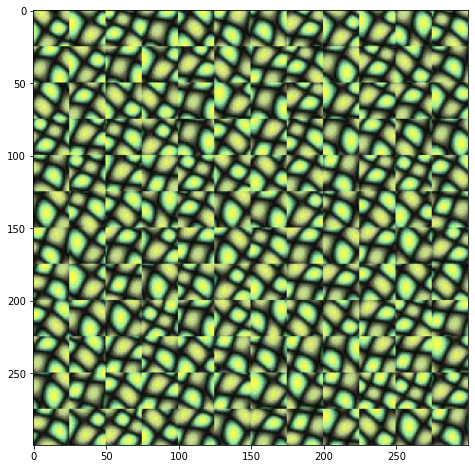

In [ ]:
sample_img_fn = datadir+'samples/test.png'
sample_img = cv2.cvtColor(cv2.imread(sample_img_fn), cv2.COLOR_BGR2RGB)
print("texture shape : ", sample_img.shape)
print("texture image : ")
plt.imshow(sample_img)
plt.show()

print()
out_size = 300
patch_size = 25
res = quilt_random(sample_img, out_size, patch_size)
if res is not None:
  print("Randomly Sampled Texture image shape : ", res.shape)
  print("Randomly Sampled Texture image : ")
  plt.figure(figsize=(8,8))
  plt.imshow(res/255)
  plt.show()

### Part II: Overlapping Patches

I created a function quilt_simple that randomly samples square patches of size patch_size from
a sample in order to create an output image of size out_size. I started by sampling a random
patch for the upper-left corner and then sampled new patches to overlap with existing ones.
This was done based on calculating the ssd cost of the overlapping regions and creating a map
signifying the portions of the outputt to be taken from the template of the chosen sample.

In [ ]:
def ssd_patch(T, M, I):
  # Suppose we have a template T, a mask M, and an image I

  # shape of ssd_cost will be equal to image shape
  ssds = np.zeros((I.shape[0],I.shape[1]))
  for i in range(3):
    ssds += ((M*T[:,:,i])**2).sum()- 2 *cv2.filter2D(I[:,:,i], ddepth=-1, kernel=M*T[:,:,i]) + cv2.filter2D(I[:,:,i]** 2, ddepth=-1, kernel=M)

  # print("ssd bata do.... ", ssds," ... ", ssds/3)
  return ssds/3

In [ ]:
def choose_sample(Cost, tol, di, dj, patch_size):
# mark edges of the cost image without enough data in them
# so that they won't be picked
  ii=int(di/2)+1
  jj=int(dj/2)+1
  Cost[:ii,:] = float("inf")
  Cost[-ii:,:] = float("inf")
  Cost[:,:jj] = float("inf")
  Cost[:,-jj:] = float("inf")
  M,N = Cost.shape
  arr = []
  # print("choose range i", int(di/2), M-int(di/2)+1)
  # print("choose range j", int(dj/2), N-int(dj/2)+1)
  for i in range(int(di/2), M-int(di/2)):
    for j in range(int(dj/2), N-int(dj/2)):
      arr.append({"cost": Cost[i][j], "i":i, "j":j})

  arr = sorted(arr, key=lambda x: x["cost"])

  k = random.randint(0, tol)
  # print("rk ck ", r[k], c[k] )
  # print("mincost  p  q di dj ",arr[k]["i"], arr[k]["j"], di, dj)
  return arr[k]["i"], arr[k]["j"]



In [ ]:
def sample_patch(img, patch_size):
  x = random.randrange(0, img.shape[0] - patch_size)
  y = random.randrange(0, img.shape[1] - patch_size)
  patch = img[x : x+patch_size, y : y+patch_size]
  return patch


In [ ]:
def quilt_simple(sample, out_size, patch_size, overlap, tol):
  """
  Randomly samples square patches of size patchsize from sample in order to create an output image of size outsize.
  Feel free to add function parameters
  :param sample: numpy.ndarray
  :param out_size: int
  :param patch_size: int
  :param overlap: int
  :param tol: float
  :return: numpy.ndarrayy
  """

  out = np.zeros((out_size, out_size,3))

  for i in range(0, out_size, patch_size - overlap):
    for j in range(0, out_size, patch_size - overlap):

      di = min(i + patch_size, out_size) - i
      dj = min(j + patch_size, out_size) - j

      # for first row and first column, the mask will be 0 since we dont have pixels to mask on at the two borders of the image.
      # for masks at other, it will be one on top row and leftmost column
      if i == 0 and j == 0:
        # out[:patch_size, :patch_size] = sample[0:patch_size, 0:patch_size]
        out[:patch_size, :patch_size] = sample_patch(sample, patch_size)
        # plt.imshow(sample_patch(sample, patch_size))
        # plt.show()
      else:

        # create mask
        mask=np.zeros((patch_size, patch_size))
        if(i> 0):
          mask[0:overlap,:]= 1
        if(j> 0):
          mask[:,0:overlap]= 1

        # create template and input image
        template=np.zeros((patch_size, patch_size,3))
        template[0:di, 0:dj] = out[i:i+di, j:j+dj]
        input_image = sample/255.0

        # find cost image
        cost = ssd_patch(template, mask, input_image)

        # find center pixel of sample patch with min_cost
        p, q = choose_sample(cost, tol, di, dj, patch_size)
        top_x = p - int((di+1)/2)
        top_y = q - int((dj+1)/2)

        out[i:i+di,j:j+dj] = sample[top_x:top_x+di, top_y:top_y+dj]
        # plt.imshow(out)
        # plt.show()
  return out


texture shape :  (192, 192, 3)
texture image : 


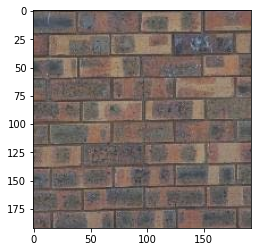


Overlapping patches Sampled Texture image shape :  (400, 400, 3)
Overlapping patches Sampled Texture image : 


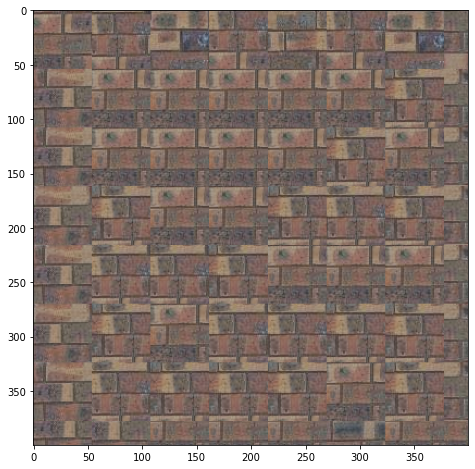

In [ ]:
sample_img_fn = datadir+'samples/bricks_small.jpg'
sample_img = cv2.cvtColor(cv2.imread(sample_img_fn), cv2.COLOR_BGR2RGB)
print("texture shape : ", sample_img.shape)
print("texture image : ")

out_size = 400
patch_size = 61
overlap = 7
tol = 6
res = quilt_simple(sample_img, out_size, patch_size, overlap, tol)
res = res/255.0
plt.imshow(sample_img)
plt.show()

print()

if res is not None:
  print("Overlapping patches Sampled Texture image shape : ", res.shape)
  print("Overlapping patches Sampled Texture image : ")
  plt.figure(figsize=(8,8))
  plt.imshow(res)
  plt.show()


texture shape :  (200, 200, 3)
texture image : 


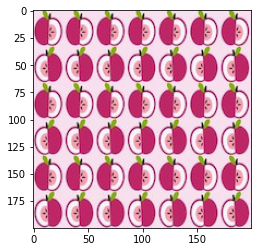


Overlapping patches Sampled Texture image shape :  (300, 300, 3)
Overlapping patches Sampled Texture image : 


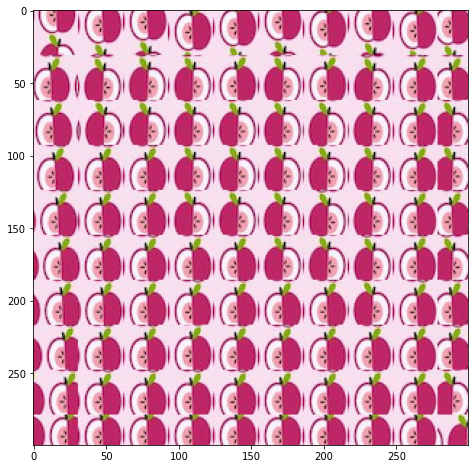

In [ ]:
sample_img_fn = datadir+'samples/apples2.jpeg'

sample_img = cv2.cvtColor(cv2.imread(sample_img_fn), cv2.COLOR_BGR2RGB)
print("texture shape : ", sample_img.shape)
print("texture image : ")
plt.imshow(sample_img)
plt.show()

out_size = 300  # change these parameters as needed
patch_size = 35
overlap = 4
tol = 2
res = quilt_simple(sample_img, out_size, patch_size, overlap, tol) #feel free to change parameters to get best results
res = res/255.0
print()
if res is not None:
  print("Overlapping patches Sampled Texture image shape : ", res.shape)
  print("Overlapping patches Sampled Texture image : ")
  plt.figure(figsize=(8,8))
  plt.imshow(res)
  plt.show()


texture shape :  (64, 64, 3)
texture image : 


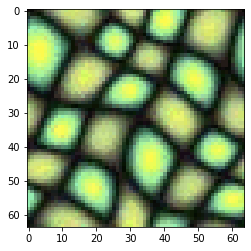


Overlapping patches Sampled Texture image shape :  (300, 300, 3)
Overlapping patches Sampled Texture image : 


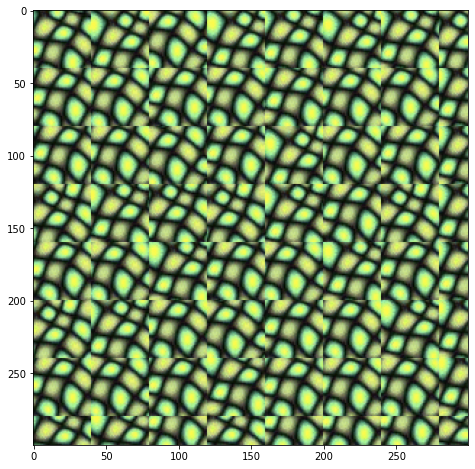

In [ ]:
sample_img_fn = datadir+'samples/test.png'

sample_img = cv2.cvtColor(cv2.imread(sample_img_fn), cv2.COLOR_BGR2RGB)
print("texture shape : ", sample_img.shape)
print("texture image : ")
plt.imshow(sample_img)
plt.show()

print()
out_size = 300  # change these parameters as needed
patch_size = 45
overlap = 5
tol = 2
res = quilt_simple(sample_img, out_size, patch_size, overlap, tol) #feel free to change parameters to get best results
res = res/255.0
if res is not None:
  print("Overlapping patches Sampled Texture image shape : ", res.shape)
  print("Overlapping patches Sampled Texture image : ")
  plt.figure(figsize=(8,8))
  plt.imshow(res)
  plt.show()


### Part III: Seam Finding


Created another function quilt_cut that finds the patch for the current template based on the min-cost contiguous path from the left to right or top to the bottom side of the patch.

In [ ]:
# from utils import cut # default cut function for seam finding section

import numpy as np

def cut(err_patch):
    """
    Compute the minimum path from the left to right side of the patch

    :param err_patch: numpy.ndarray    cost of cutting through each pixel
    :return: numpy.ndarray             a 0-1 mask that indicates which pixels should be on either side of the cut
    """
    # print("err_patch.shape... ",err_patch.shape)
    # create padding on top and bottom with very large cost
    padding = np.expand_dims(np.ones(err_patch.shape[1]).T*1e10,0)
    # print("padding... ",padding.shape)
    err_patch = np.concatenate((padding, err_patch, padding), axis=0)
    h, w = err_patch.shape
    path = np.zeros([h,w], dtype="int")
    cost = np.zeros([h,w])
    cost[:,0] = err_patch[:, 0]
    cost[0,:] = err_patch[0, :]
    cost[cost.shape[0]-1,:] = err_patch[err_patch.shape[0]-1, :]

    # for each column, compute the cheapest connected path to the left
    # cost of path for each row from left upper/same/lower pixel
    for x in range(1,w):
        # cost of path for each row from left upper/same/lower pixel
        tmp = np.vstack((cost[0:h-2,x-1], cost[1:h-1, x-1], cost[2:h, x-1]))
        mi = tmp.argmin(axis=0)
        path[1:h-1, x] = np.arange(1, h-1, 1).T + mi # save the next step of the path
        cost[1:h-1, x] = cost[path[1:h-1, x] - 1, x-1] + err_patch[1:h-1, x]

    path = path[1:path.shape[0]-1, :] - 1
    cost = cost[1:cost.shape[0]-1, :]

    # create the mask based on the best path
    mask = np.zeros(path.shape, dtype="int")
    best_path = np.zeros(path.shape[1], dtype="int")
    best_path[len(best_path)-1] = np.argmin(cost[:, cost.shape[1]-1]) + 1
    mask[0:best_path[best_path.shape[0]-1], mask.shape[1]-1] = 1
    for x in range(best_path.size-1, 0, -1):
        best_path[x-1] = path[best_path[x]-1, x]
        mask[:best_path[x-1], x-1] = 1
    mask ^= 1
    return mask

In [ ]:
# optional or use cut(err_patch) directly
def customized_cut(bndcost):
    pass

In [ ]:
from IPython.lib.security import passwd_check
from skimage.color import rgb2gray
def quilt_cut(sample, out_size, patch_size, overlap, tol):
  """
  Samples square patches of size patchsize from sample using seam finding in order to create an output image of size outsize.
  Feel free to add function parameters
  :param sample: numpy.ndarray
  :param out_size: int
  :param patch_size: int
  :param overlap: int
  :param tol: float
  :return: numpy.ndarray
  """
  out = np.zeros((out_size, out_size,3))

  for i in range(0, out_size, patch_size - overlap):
    for j in range(0, out_size, patch_size - overlap):

      # handle mask size for end patch(index reaches more than out_size)
      di = min(i + patch_size, out_size) - i
      dj = min(j + patch_size, out_size) - j

      if i == 0 and j == 0:
        out[:patch_size, :patch_size] = sample[0:patch_size, 0:patch_size]
        # out[:patch_size, :patch_size] = sample_patch(sample, patch_size)
        # plt.imshow(out/225)
        # plt.show()
      else:
        # create mask
        mask=np.zeros((patch_size, patch_size))
        if(i> 0):
          mask[0:overlap,:]= 1
        if(j> 0):
          mask[:,0:overlap]= 1

        # create template and input image
        template=np.zeros((patch_size, patch_size,3))
        template[0:di, 0:dj] = out[i:i+di, j:j+dj]
        input_image = sample/255.0

        # find cost image
        cost = ssd_patch(template, mask, input_image)
        # print("cost matrix for template, mask, input_image ", cost)

        # find center pixel of sample patch with min_cost
        p, q = choose_sample(cost, tol, di, dj, patch_size)
        top_x = p - int((di+1)/2)
        top_y = q - int((dj+1)/2)

        # out[i:i+di,j:j+dj] = sample[top_x:top_x+di, top_y:top_y+dj]
        sample_chosen = sample[top_x:top_x+di, top_y:top_y+dj]
        template = out[i:i + di, j:j + dj]

        # print("sample_chosen :")
        # plt.imshow(sample_chosen/255.0)
        # plt.show()

        # print("template :")
        # plt.imshow(template/255.0)
        # plt.show()

        final_mask = np.zeros(template.shape)
        if j != 0:
          diff_sqr = (template[:, :overlap, :] - sample_chosen[:, :overlap, :])**2
          error_vertical = cut(np.sum(diff_sqr, axis=2).T).T
          # print("pixelwise ssd for vertical overlap : ")
          # plt.imshow(np.sum(diff_sqr, axis=2), cmap='gray')
          # plt.show()
          error_vertical = np.repeat(error_vertical[:, :, np.newaxis], 3, axis=2)
          final_mask[:, :overlap] += error_vertical

          # print("vertical mask :")
          # plt.imshow(final_mask[:, :overlap])
          # plt.show()

        if i != 0:
          diff_sqr = (template[:overlap, :, :] - sample_chosen[:overlap, :, :])**2
          error_horizontal = cut(np.sum(diff_sqr, axis=2))
          # print("pixelwise ssd for horizontal overlap : ")
          # plt.imshow(np.sum(diff_sqr, axis=2), cmap='gray')
          # plt.show()
          error_horizontal = np.repeat(error_horizontal[:, :, np.newaxis], 3, axis=2)
          final_mask[:overlap, :] += error_horizontal

          # print("horizontal mask :")
          # plt.imshow(final_mask[:overlap, :])
          # plt.show()

        if(i>0 and j==0):
          final_mask[overlap:, :] = 1
        elif(j>0 and i==0):
          final_mask[:, overlap:] = 1
        elif(i>0 and j>0):
          final_mask[:overlap, :overlap] = 0
          final_mask[overlap:, overlap:] = 1
          pass

        # print("final mask :")
        # plt.imshow(final_mask)
        # plt.show()

        out[i:i + di, j:j + dj] = final_mask * sample_chosen + (1-final_mask) * template
        # print("output :")
        # plt.imshow(out[i:i + di, j:j + dj]/255.0)
        # plt.show()

  return out

texture shape :  (192, 192, 3)
texture image : 


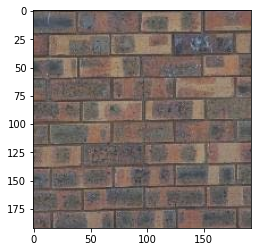


Minimum cut boundary Sampled Texture image shape :  (300, 300, 3)
Minimum cut boundary Sampled Texture image : 


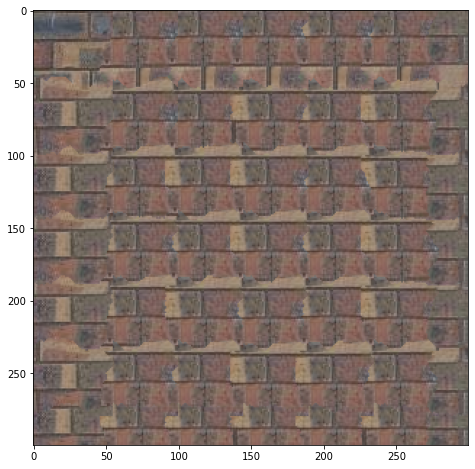

In [ ]:
sample_img_fn = datadir+'samples/bricks_small.jpg'

sample_img = cv2.cvtColor(cv2.imread(sample_img_fn), cv2.COLOR_BGR2RGB)
print("texture shape : ", sample_img.shape)
print("texture image : ")

out_size = 300  # change these parameters as needed
patch_size = 55
overlap = 10

tol = 3
res = quilt_cut(sample_img, out_size, patch_size, overlap, tol)
plt.imshow(sample_img)
plt.show()
print()
if res is not None:
  res = res/255.0
  print("Minimum cut boundary Sampled Texture image shape : ", res.shape)
  print("Minimum cut boundary Sampled Texture image : ")
  plt.figure(figsize=(8,8))
  plt.imshow(res)
  plt.show()

texture shape :  (200, 200, 3)
texture image : 


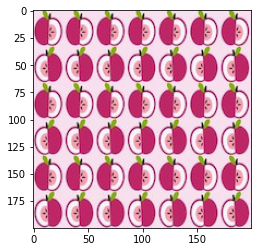


Minimum cut boundary Sampled Texture image shape :  (400, 400, 3)
Minimum cut boundary Sampled Texture image : 


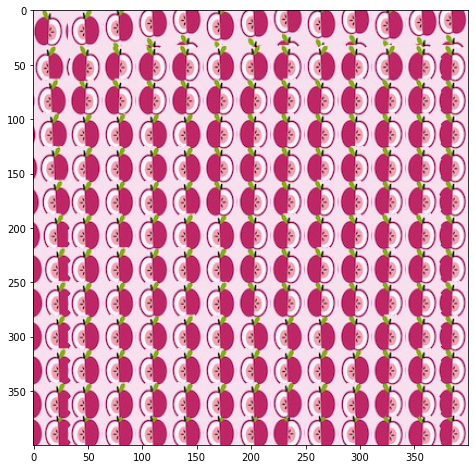

In [ ]:
sample_img_fn = datadir+'/samples/apples2.jpeg'

sample_img = cv2.cvtColor(cv2.imread(sample_img_fn), cv2.COLOR_BGR2RGB)
print("texture shape : ", sample_img.shape)
print("texture image : ")

out_size = 400
patch_size = 35
overlap = 4
tol = 1
res = quilt_cut(sample_img, out_size, patch_size, overlap, tol)
res = res/255.0
plt.imshow(sample_img)
plt.show()
print()
if res is not None:
  print("Minimum cut boundary Sampled Texture image shape : ", res.shape)
  print("Minimum cut boundary Sampled Texture image : ")
  plt.figure(figsize=(8,8))
  plt.imshow(res)

texture shape :  (203, 150, 3)
texture image : 


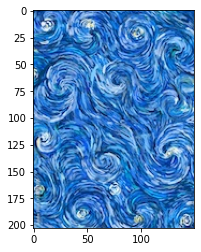


Minimum cut boundary Sampled Texture image shape :  (400, 400, 3)
Minimum cut boundary Sampled Texture image : 


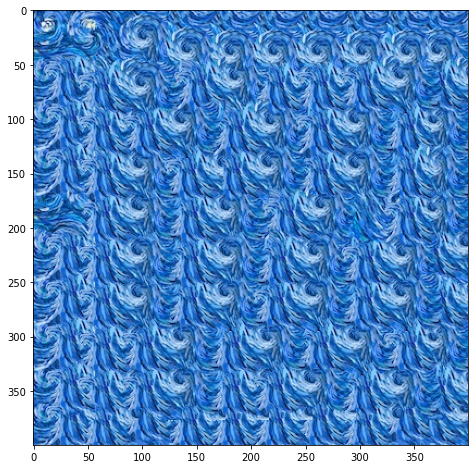

In [ ]:
sample_img_fn = datadir+'/samples/texture1.jpeg'

sample_img = cv2.cvtColor(cv2.imread(sample_img_fn), cv2.COLOR_BGR2RGB)
print("texture shape : ", sample_img.shape)
print("texture image : ")

out_size = 400
patch_size = 57
overlap = 17
tol = 1
res = quilt_cut(sample_img, out_size, patch_size, overlap, tol)
res = res/255.0
plt.imshow(sample_img)
plt.show()
print()
if res is not None:
  print("Minimum cut boundary Sampled Texture image shape : ", res.shape)
  print("Minimum cut boundary Sampled Texture image : ")
  plt.figure(figsize=(8,8))
  plt.imshow(res)

#### ILLUSTRATION OF SEAM FINDING

texture shape :  (64, 64, 3)
texture image : 


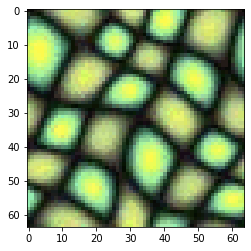


sample_chosen :


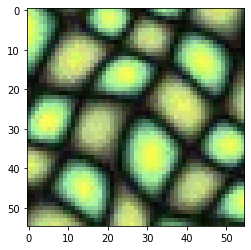

template :


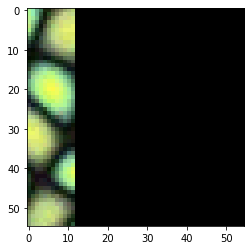

pixelwise ssd for vertical overlap : 


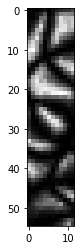

vertical mask :


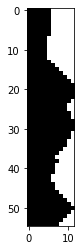

final mask :


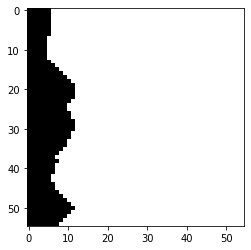

output :


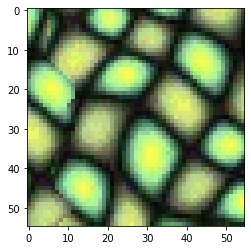

sample_chosen :


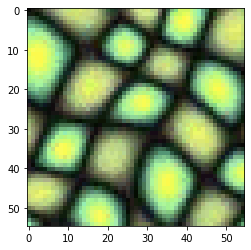

template :


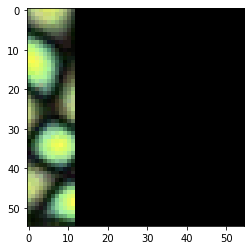

pixelwise ssd for vertical overlap : 


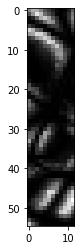

vertical mask :


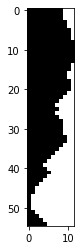

final mask :


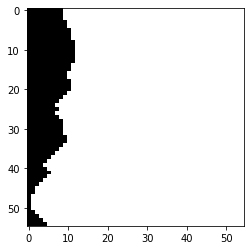

output :


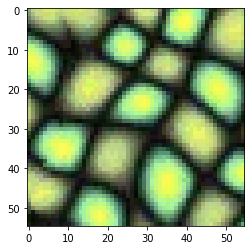

sample_chosen :


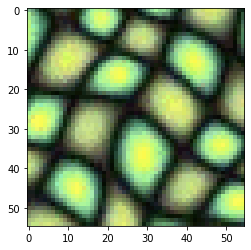

template :


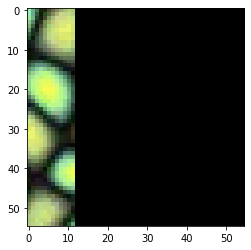

pixelwise ssd for vertical overlap : 


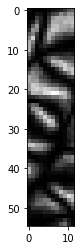

vertical mask :


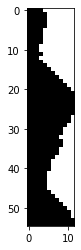

final mask :


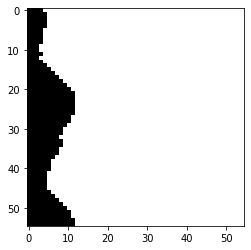

output :


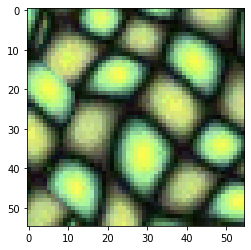

sample_chosen :


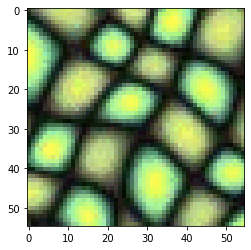

template :


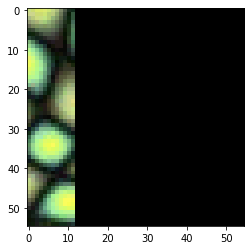

pixelwise ssd for vertical overlap : 


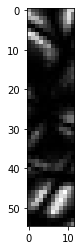

vertical mask :


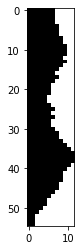

final mask :


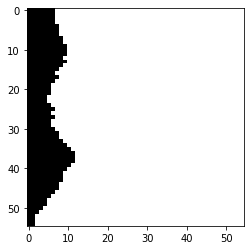

output :


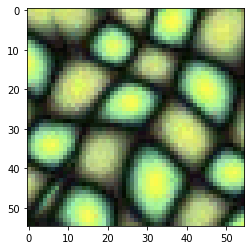

sample_chosen :


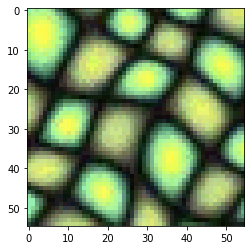

template :


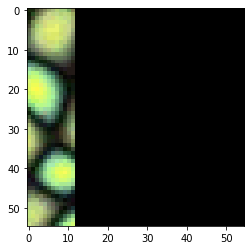

pixelwise ssd for vertical overlap : 


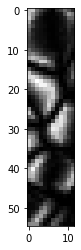

vertical mask :


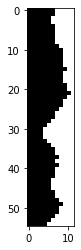

final mask :


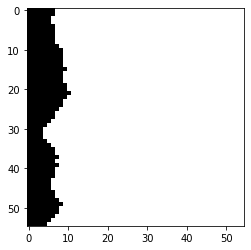

output :


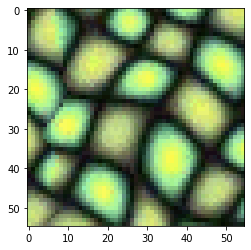

sample_chosen :


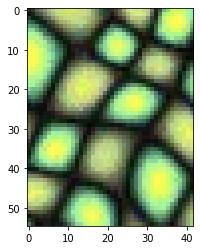

template :


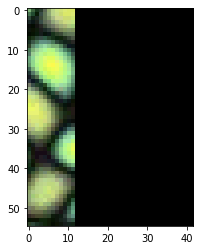

pixelwise ssd for vertical overlap : 


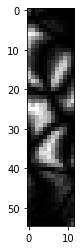

vertical mask :


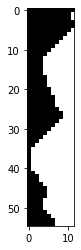

final mask :


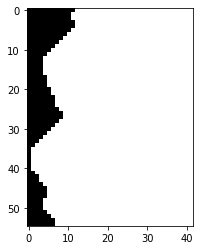

output :


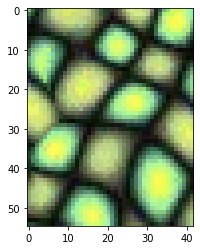

sample_chosen :


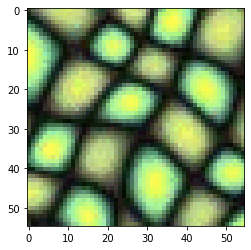

template :


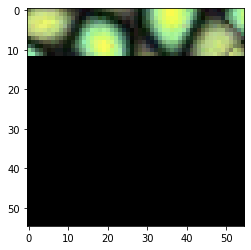

pixelwise ssd for horizontal overlap : 


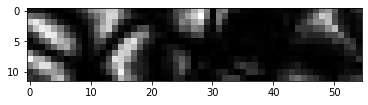

horizontal mask :


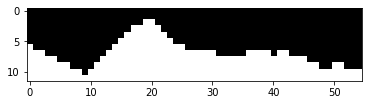

final mask :


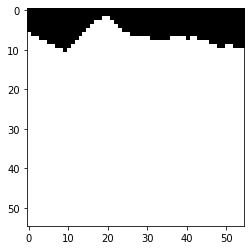

output :


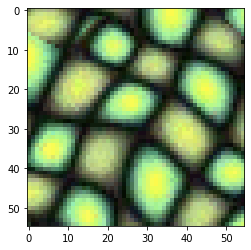

sample_chosen :


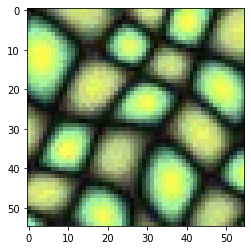

template :


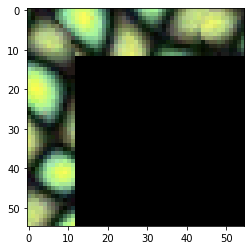

pixelwise ssd for vertical overlap : 


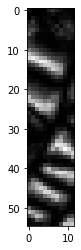

vertical mask :


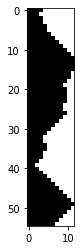

pixelwise ssd for horizontal overlap : 


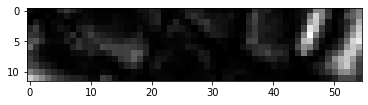

horizontal mask :


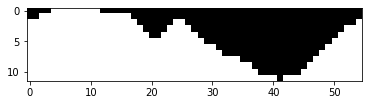

final mask :


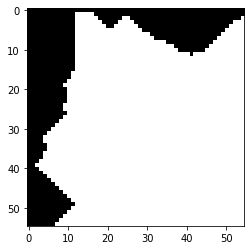

output :


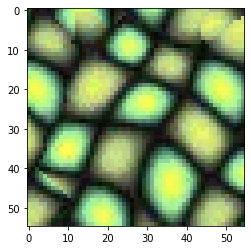

sample_chosen :


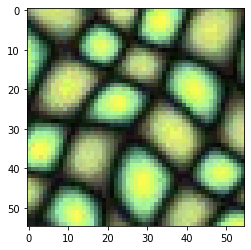

template :


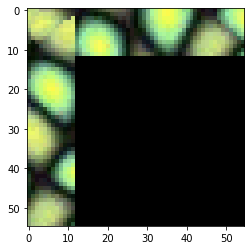

pixelwise ssd for vertical overlap : 


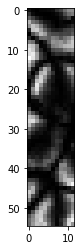

vertical mask :


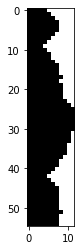

pixelwise ssd for horizontal overlap : 


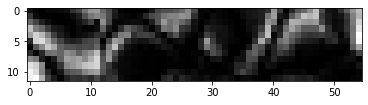

horizontal mask :


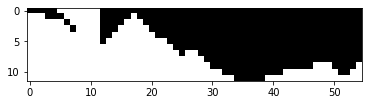

final mask :


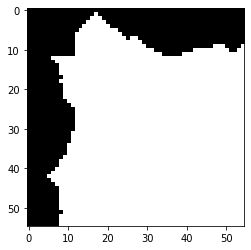

output :


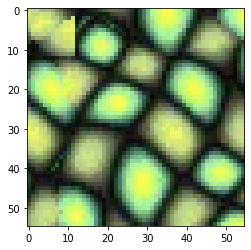

sample_chosen :


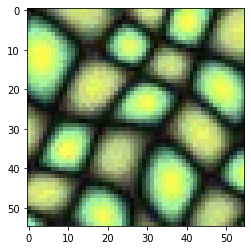

template :


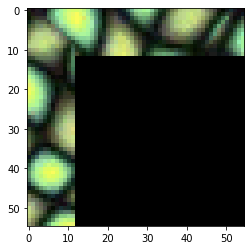

pixelwise ssd for vertical overlap : 


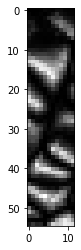

vertical mask :


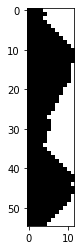

pixelwise ssd for horizontal overlap : 


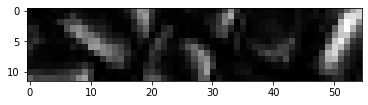

horizontal mask :


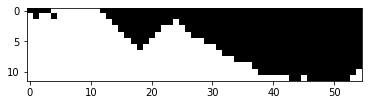

final mask :


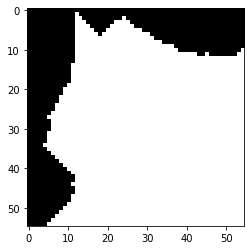

output :


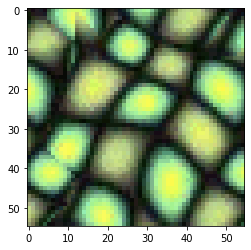

sample_chosen :


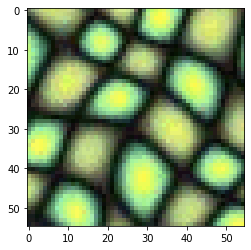

template :


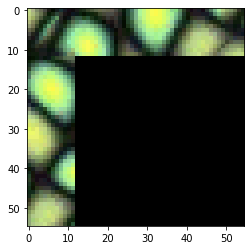

pixelwise ssd for vertical overlap : 


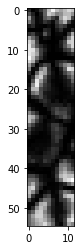

vertical mask :


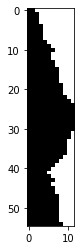

pixelwise ssd for horizontal overlap : 


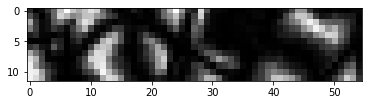

horizontal mask :


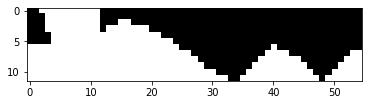

final mask :


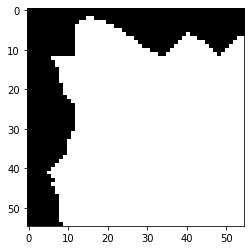

output :


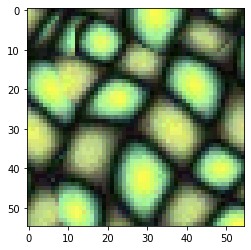

sample_chosen :


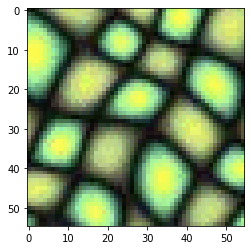

template :


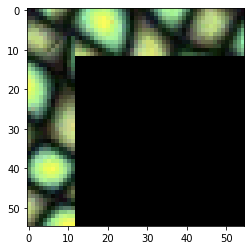

pixelwise ssd for vertical overlap : 


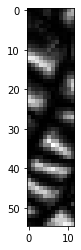

vertical mask :


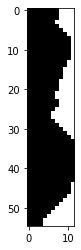

pixelwise ssd for horizontal overlap : 


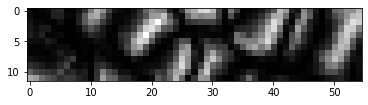

horizontal mask :


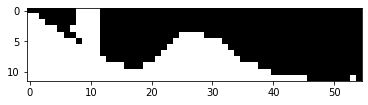

final mask :


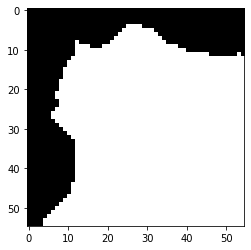

output :


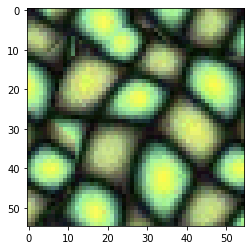

sample_chosen :


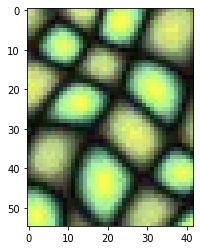

template :


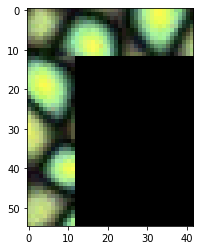

pixelwise ssd for vertical overlap : 


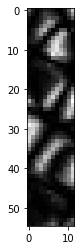

vertical mask :


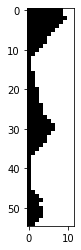

pixelwise ssd for horizontal overlap : 


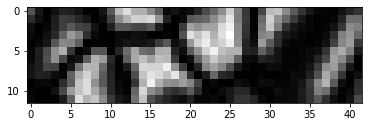

horizontal mask :


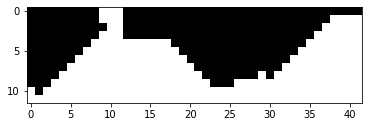

final mask :


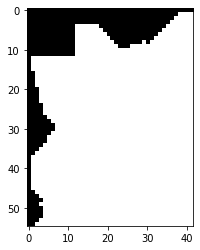

output :


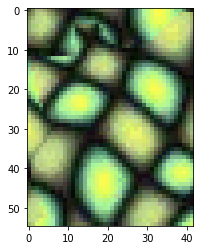

sample_chosen :


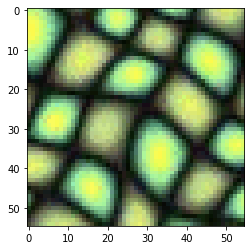

template :


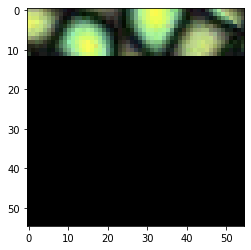

pixelwise ssd for horizontal overlap : 


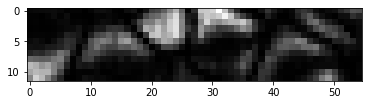

horizontal mask :


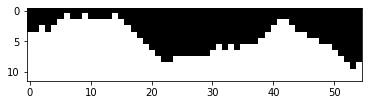

final mask :


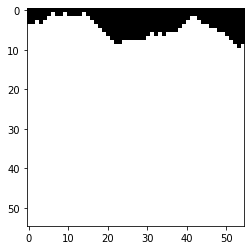

output :


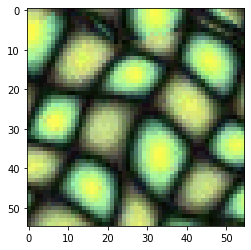

sample_chosen :


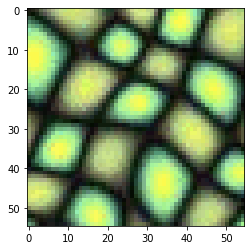

template :


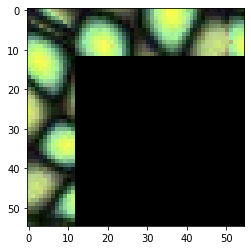

pixelwise ssd for vertical overlap : 


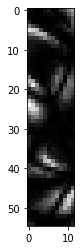

vertical mask :


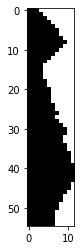

pixelwise ssd for horizontal overlap : 


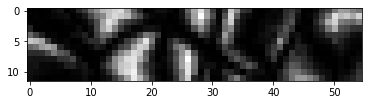

horizontal mask :


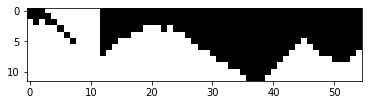

final mask :


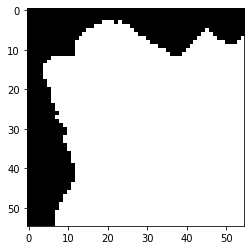

output :


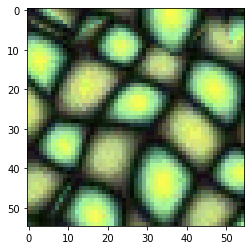

sample_chosen :


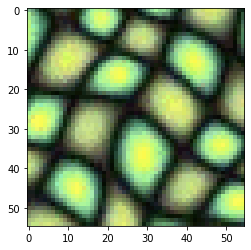

template :


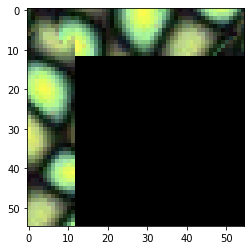

pixelwise ssd for vertical overlap : 


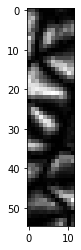

vertical mask :


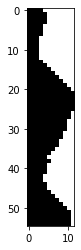

pixelwise ssd for horizontal overlap : 


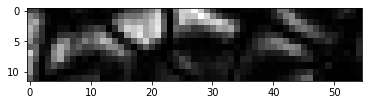

horizontal mask :


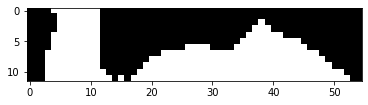

final mask :


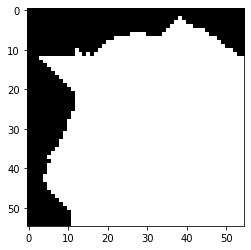

output :


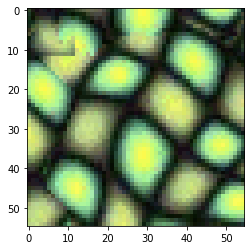

sample_chosen :


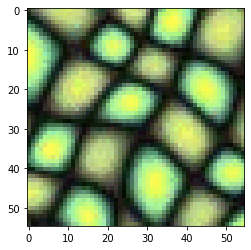

template :


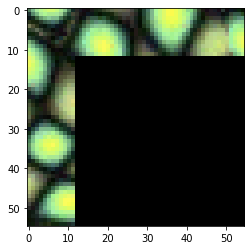

pixelwise ssd for vertical overlap : 


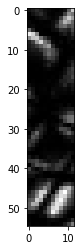

vertical mask :


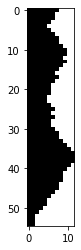

pixelwise ssd for horizontal overlap : 


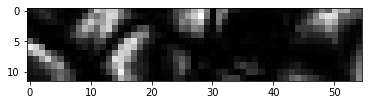

horizontal mask :


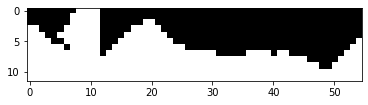

final mask :


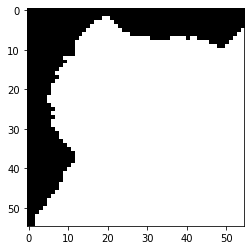

output :


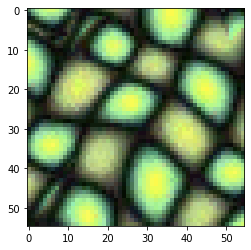

sample_chosen :


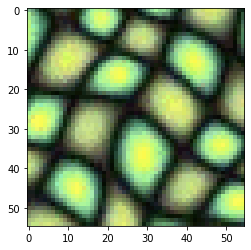

template :


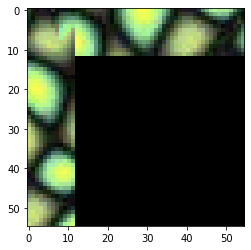

pixelwise ssd for vertical overlap : 


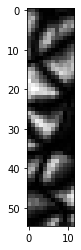

vertical mask :


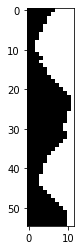

pixelwise ssd for horizontal overlap : 


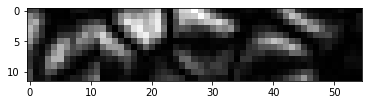

horizontal mask :


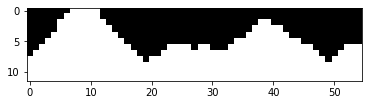

final mask :


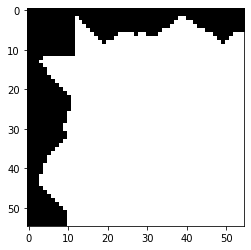

output :


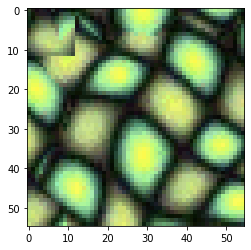

sample_chosen :


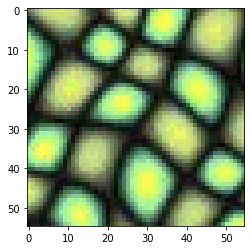

template :


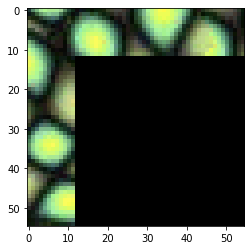

pixelwise ssd for vertical overlap : 


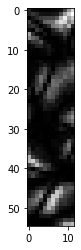

vertical mask :


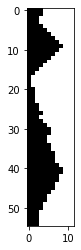

pixelwise ssd for horizontal overlap : 


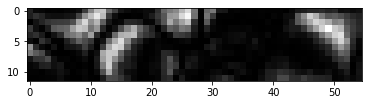

horizontal mask :


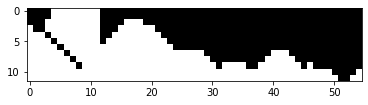

final mask :


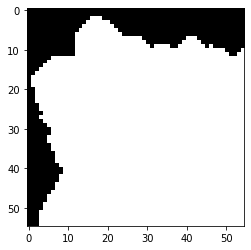

output :


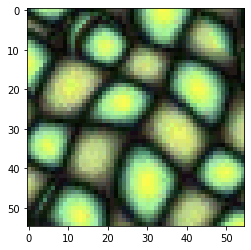

sample_chosen :


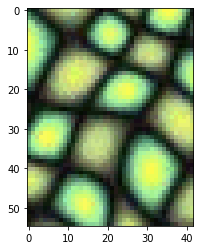

template :


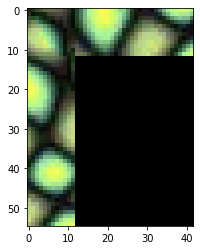

pixelwise ssd for vertical overlap : 


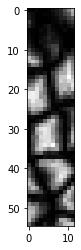

vertical mask :


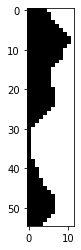

pixelwise ssd for horizontal overlap : 


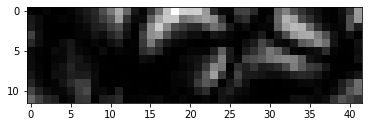

horizontal mask :


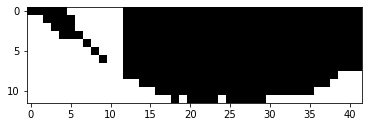

final mask :


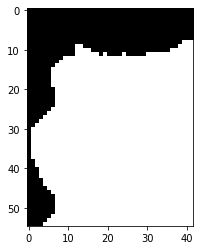

output :


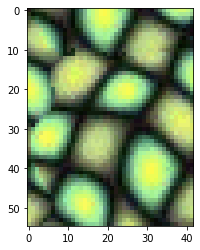

sample_chosen :


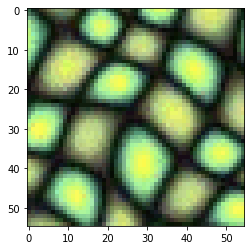

template :


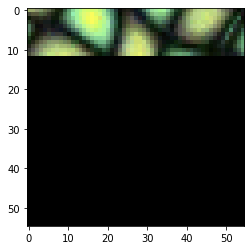

pixelwise ssd for horizontal overlap : 


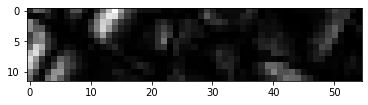

horizontal mask :


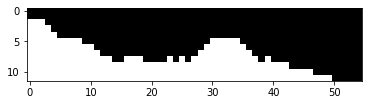

final mask :


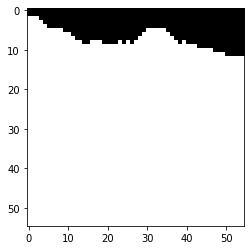

output :


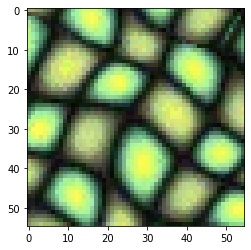

sample_chosen :


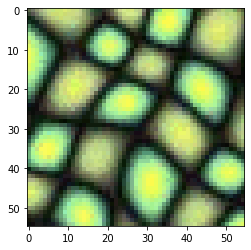

template :


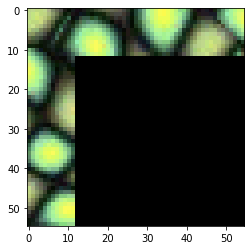

pixelwise ssd for vertical overlap : 


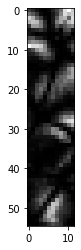

vertical mask :


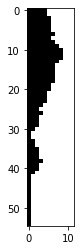

pixelwise ssd for horizontal overlap : 


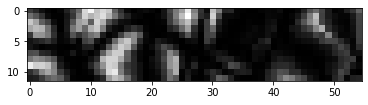

horizontal mask :


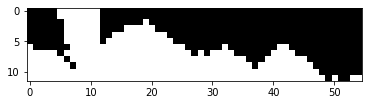

final mask :


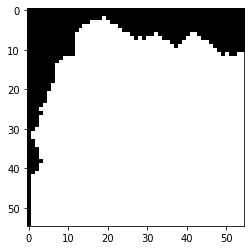

output :


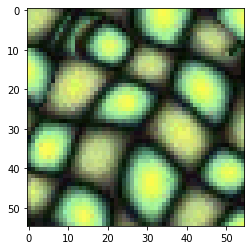

sample_chosen :


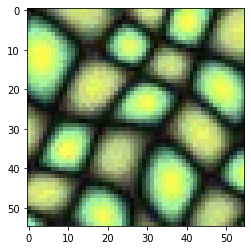

template :


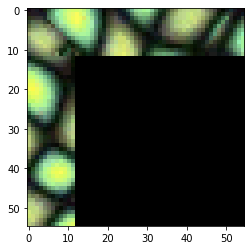

pixelwise ssd for vertical overlap : 


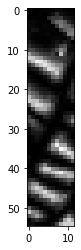

vertical mask :


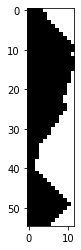

pixelwise ssd for horizontal overlap : 


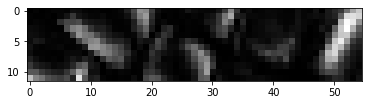

horizontal mask :


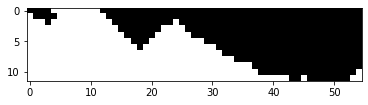

final mask :


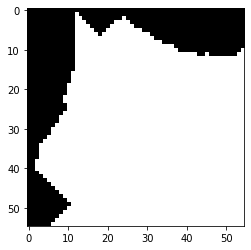

output :


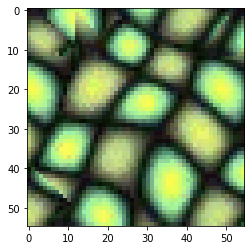

sample_chosen :


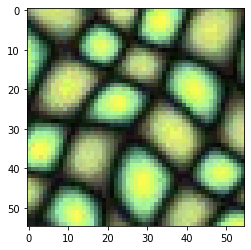

template :


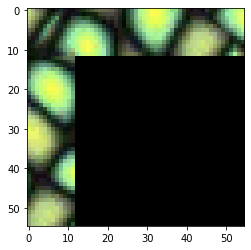

pixelwise ssd for vertical overlap : 


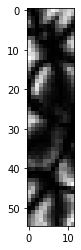

vertical mask :


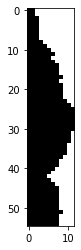

pixelwise ssd for horizontal overlap : 


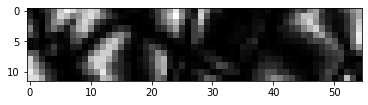

horizontal mask :


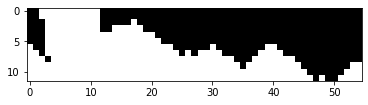

final mask :


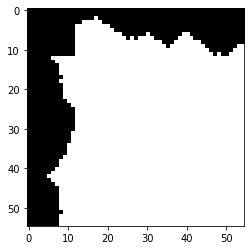

output :


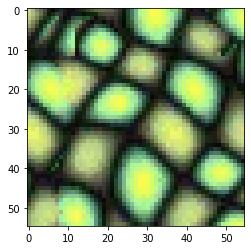

sample_chosen :


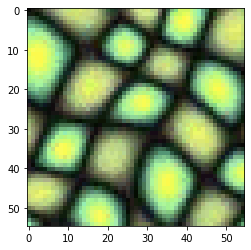

template :


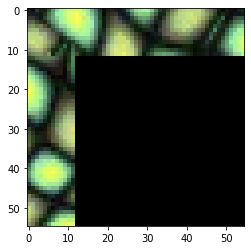

pixelwise ssd for vertical overlap : 


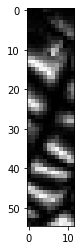

vertical mask :


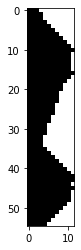

pixelwise ssd for horizontal overlap : 


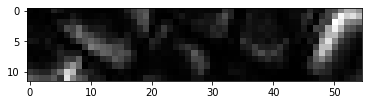

horizontal mask :


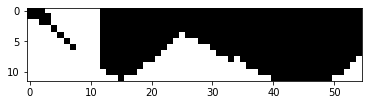

final mask :


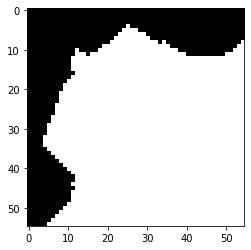

output :


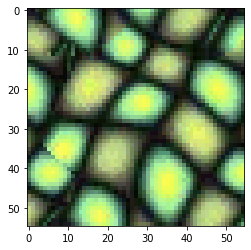

sample_chosen :


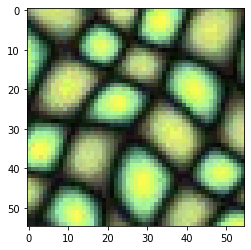

template :


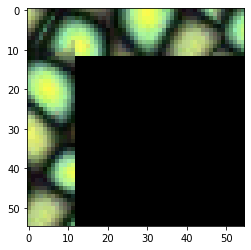

pixelwise ssd for vertical overlap : 


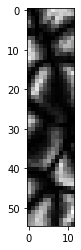

vertical mask :


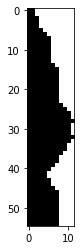

pixelwise ssd for horizontal overlap : 


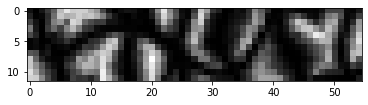

horizontal mask :


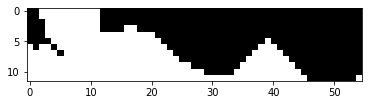

final mask :


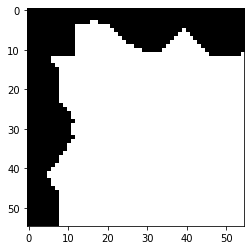

output :


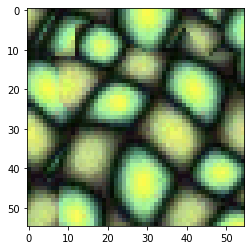

sample_chosen :


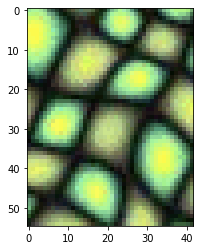

template :


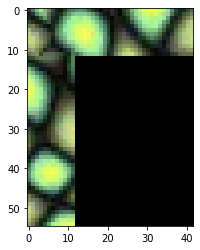

pixelwise ssd for vertical overlap : 


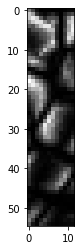

vertical mask :


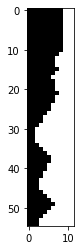

pixelwise ssd for horizontal overlap : 


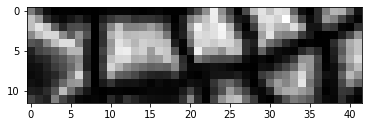

horizontal mask :


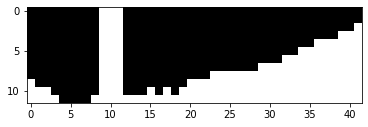

final mask :


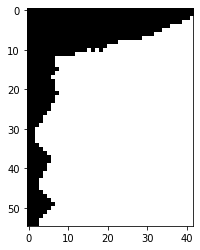

output :


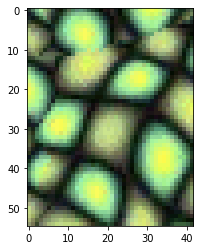

sample_chosen :


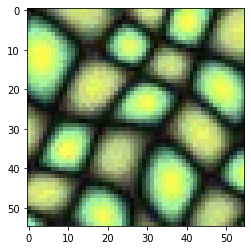

template :


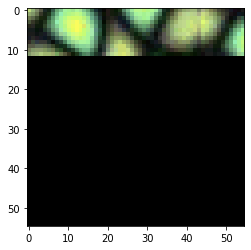

pixelwise ssd for horizontal overlap : 


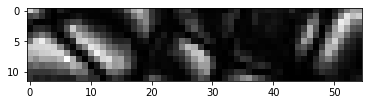

horizontal mask :


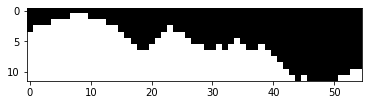

final mask :


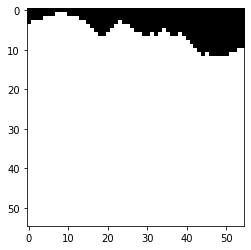

output :


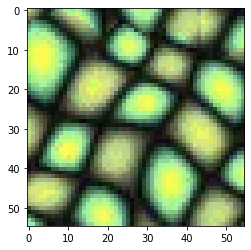

sample_chosen :


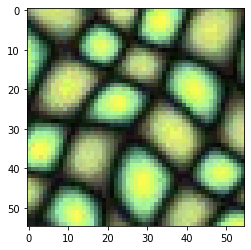

template :


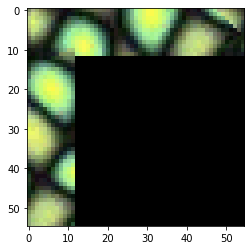

pixelwise ssd for vertical overlap : 


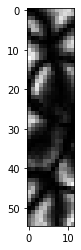

vertical mask :


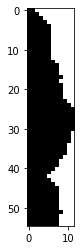

pixelwise ssd for horizontal overlap : 


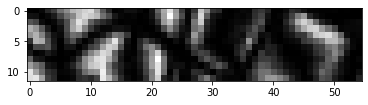

horizontal mask :


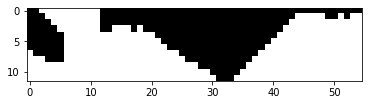

final mask :


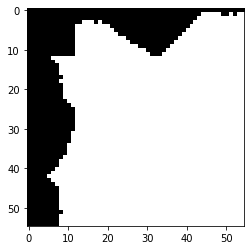

output :


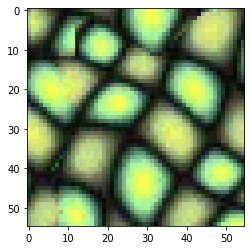

sample_chosen :


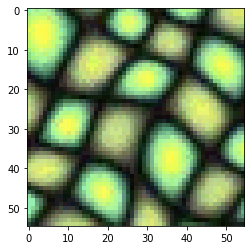

template :


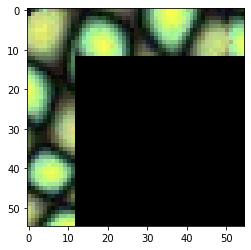

pixelwise ssd for vertical overlap : 


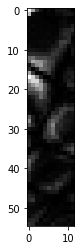

vertical mask :


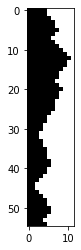

pixelwise ssd for horizontal overlap : 


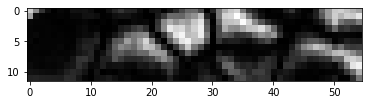

horizontal mask :


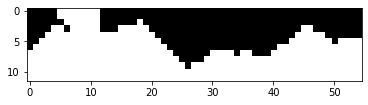

final mask :


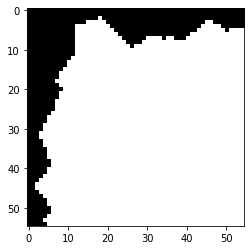

output :


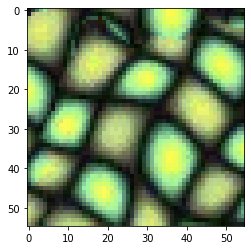

sample_chosen :


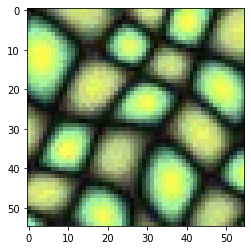

template :


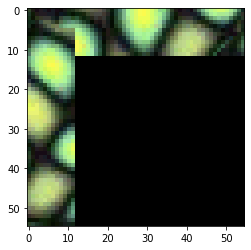

pixelwise ssd for vertical overlap : 


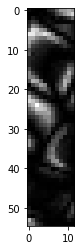

vertical mask :


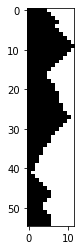

pixelwise ssd for horizontal overlap : 


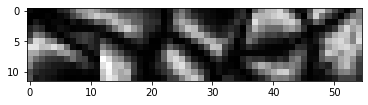

horizontal mask :


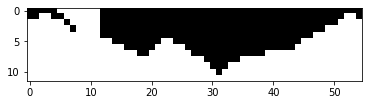

final mask :


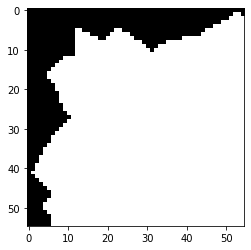

output :


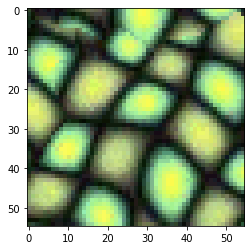

sample_chosen :


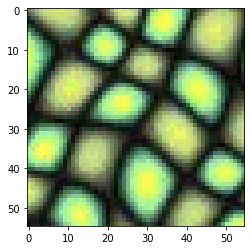

template :


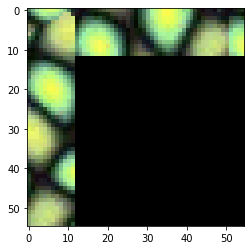

pixelwise ssd for vertical overlap : 


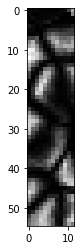

vertical mask :


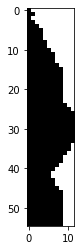

pixelwise ssd for horizontal overlap : 


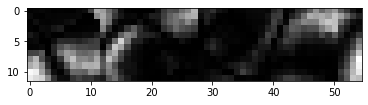

horizontal mask :


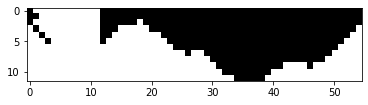

final mask :


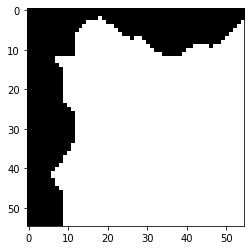

output :


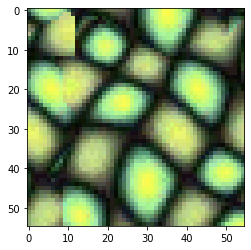

sample_chosen :


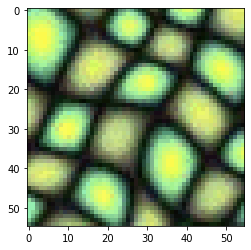

template :


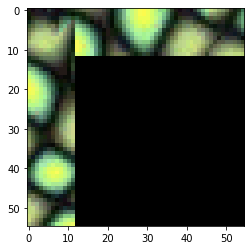

pixelwise ssd for vertical overlap : 


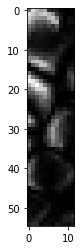

vertical mask :


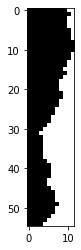

pixelwise ssd for horizontal overlap : 


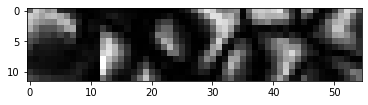

horizontal mask :


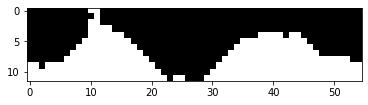

final mask :


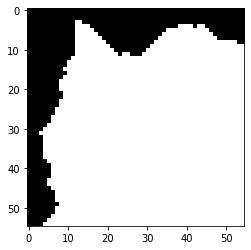

output :


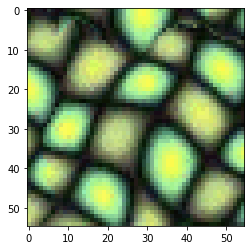

sample_chosen :


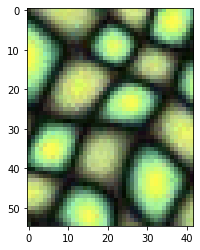

template :


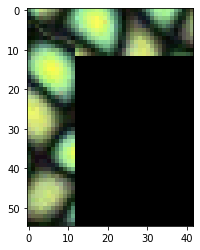

pixelwise ssd for vertical overlap : 


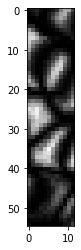

vertical mask :


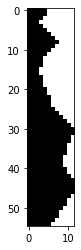

pixelwise ssd for horizontal overlap : 


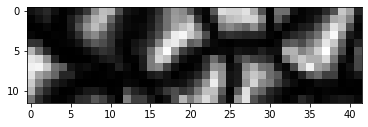

horizontal mask :


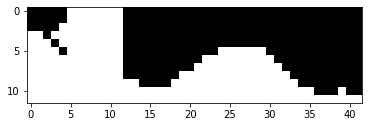

final mask :


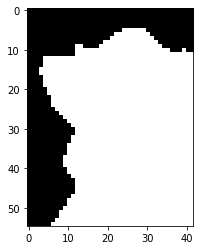

output :


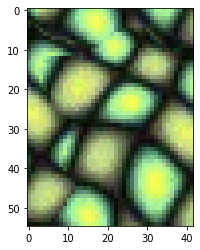

sample_chosen :


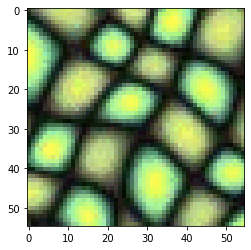

template :


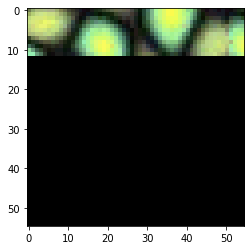

pixelwise ssd for horizontal overlap : 


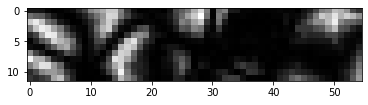

horizontal mask :


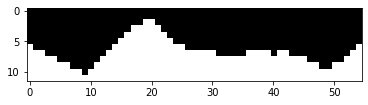

final mask :


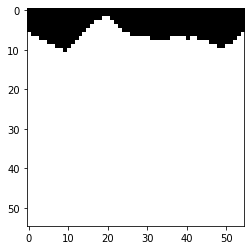

output :


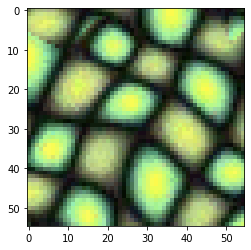

sample_chosen :


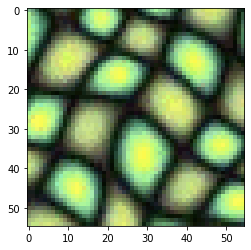

template :


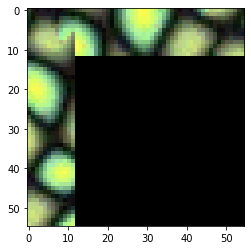

pixelwise ssd for vertical overlap : 


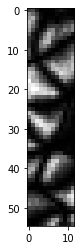

vertical mask :


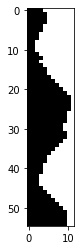

pixelwise ssd for horizontal overlap : 


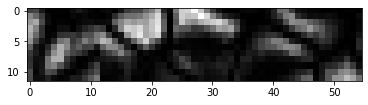

horizontal mask :


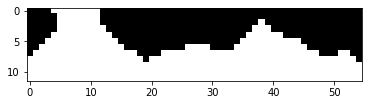

final mask :


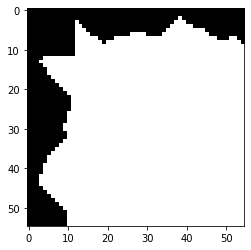

output :


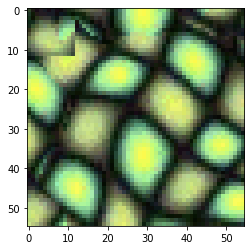

sample_chosen :


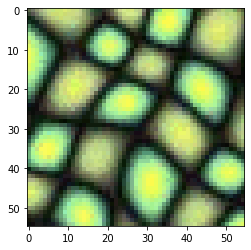

template :


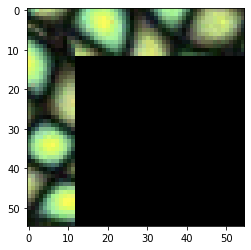

pixelwise ssd for vertical overlap : 


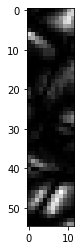

vertical mask :


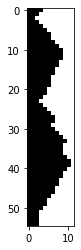

pixelwise ssd for horizontal overlap : 


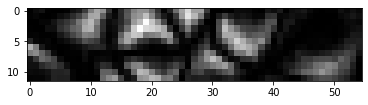

horizontal mask :


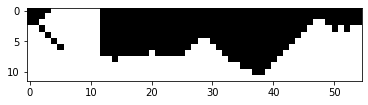

final mask :


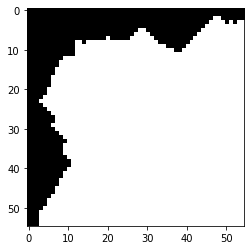

output :


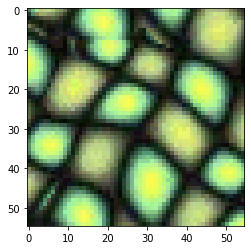

sample_chosen :


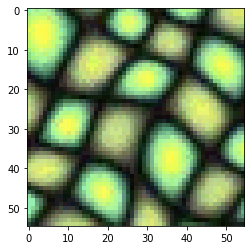

template :


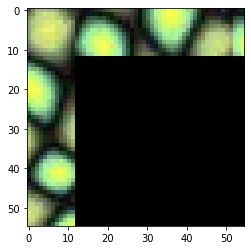

pixelwise ssd for vertical overlap : 


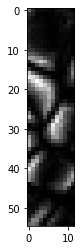

vertical mask :


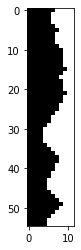

pixelwise ssd for horizontal overlap : 


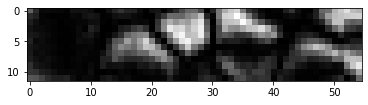

horizontal mask :


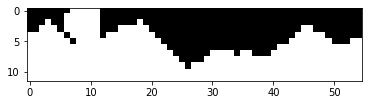

final mask :


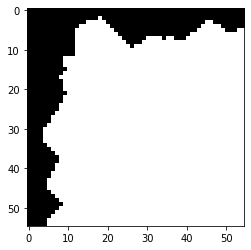

output :


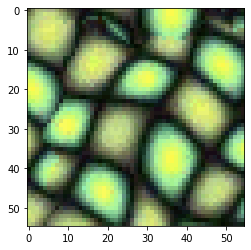

sample_chosen :


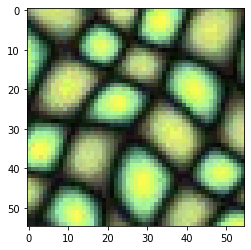

template :


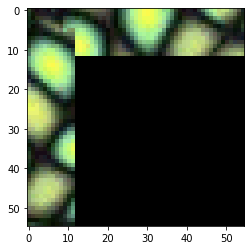

pixelwise ssd for vertical overlap : 


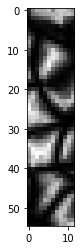

vertical mask :


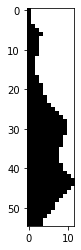

pixelwise ssd for horizontal overlap : 


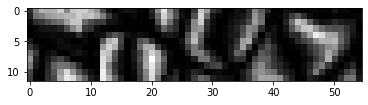

horizontal mask :


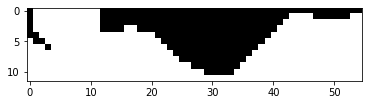

final mask :


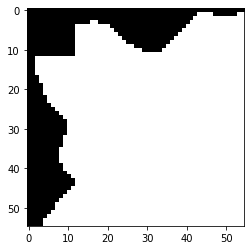

output :


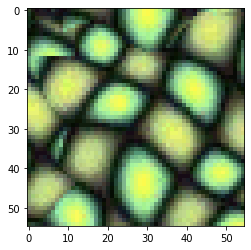

sample_chosen :


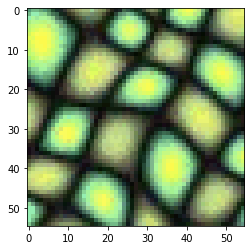

template :


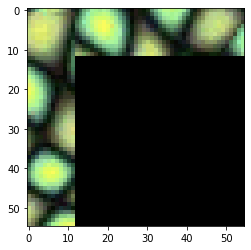

pixelwise ssd for vertical overlap : 


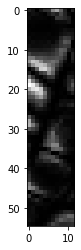

vertical mask :


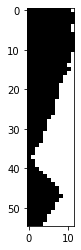

pixelwise ssd for horizontal overlap : 


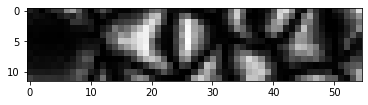

horizontal mask :


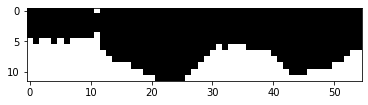

final mask :


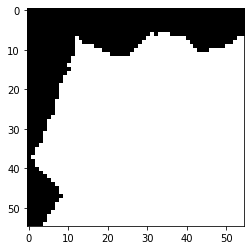

output :


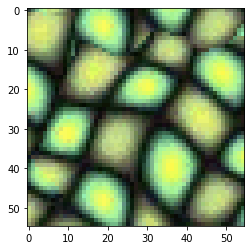

sample_chosen :


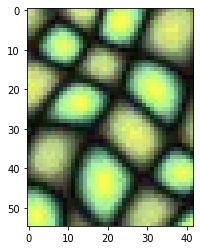

template :


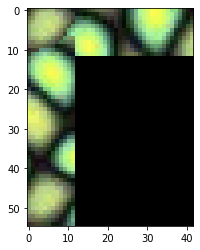

pixelwise ssd for vertical overlap : 


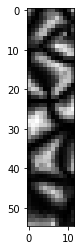

vertical mask :


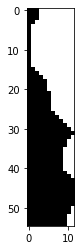

pixelwise ssd for horizontal overlap : 


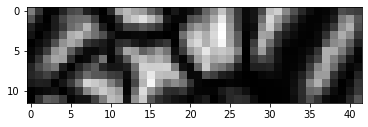

horizontal mask :


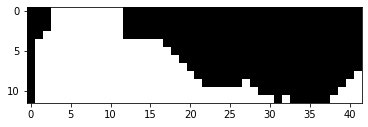

final mask :


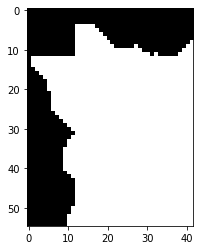

output :


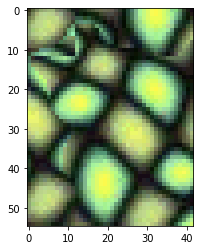

sample_chosen :


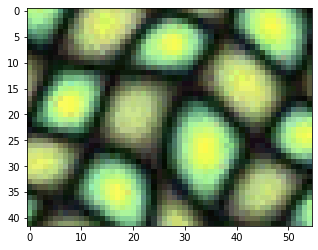

template :


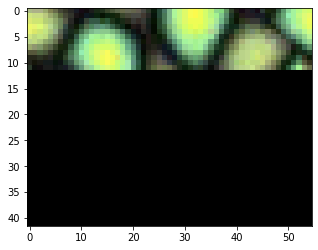

pixelwise ssd for horizontal overlap : 


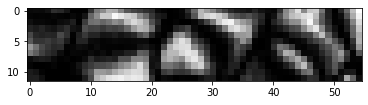

horizontal mask :


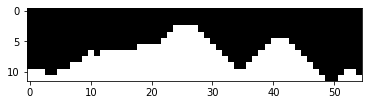

final mask :


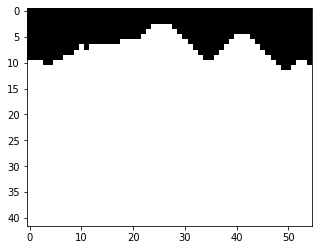

output :


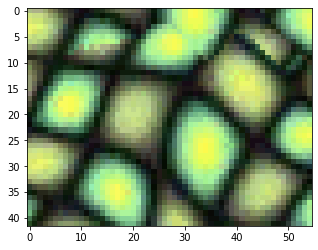

sample_chosen :


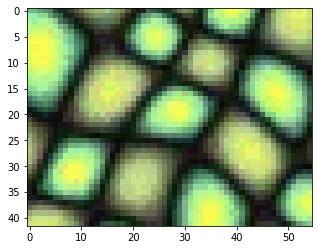

template :


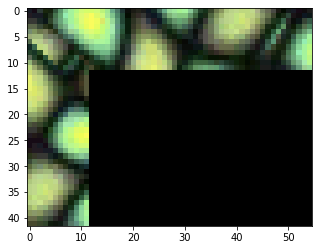

pixelwise ssd for vertical overlap : 


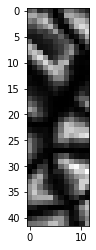

vertical mask :


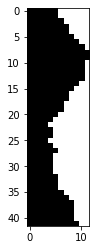

pixelwise ssd for horizontal overlap : 


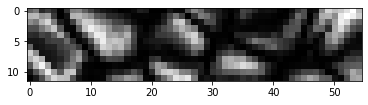

horizontal mask :


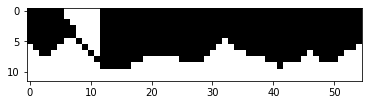

final mask :


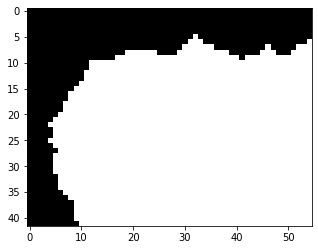

output :


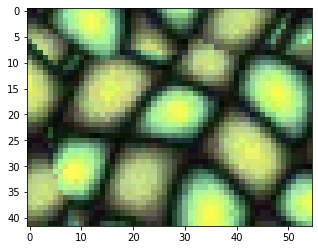

sample_chosen :


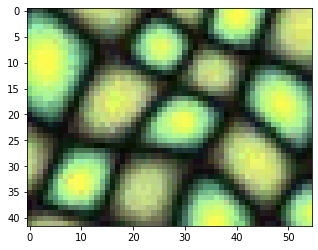

template :


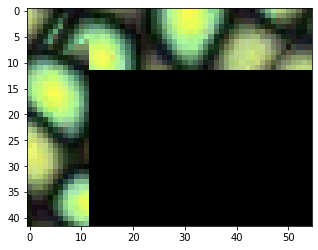

pixelwise ssd for vertical overlap : 


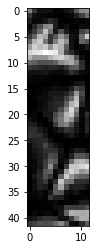

vertical mask :


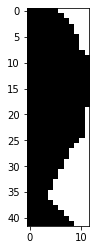

pixelwise ssd for horizontal overlap : 


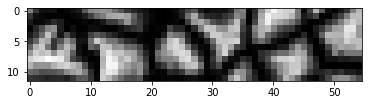

horizontal mask :


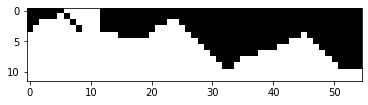

final mask :


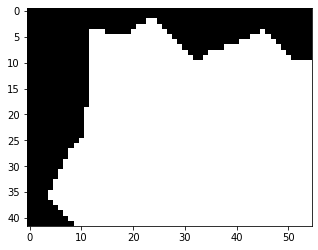

output :


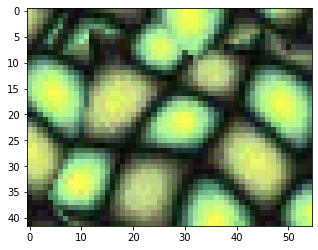

sample_chosen :


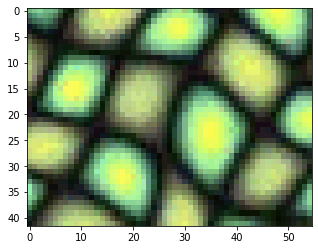

template :


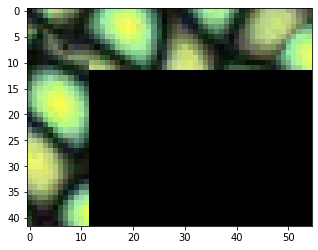

pixelwise ssd for vertical overlap : 


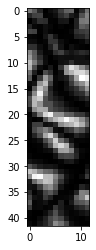

vertical mask :


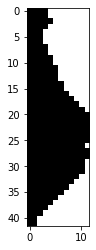

pixelwise ssd for horizontal overlap : 


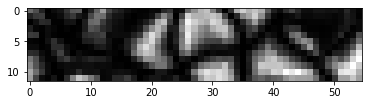

horizontal mask :


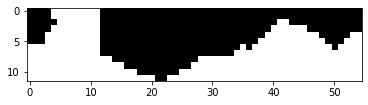

final mask :


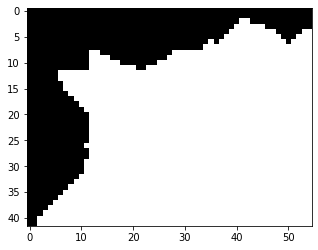

output :


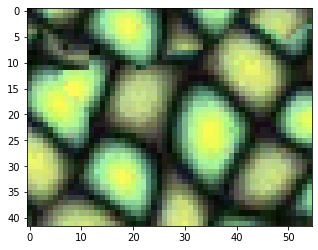

sample_chosen :


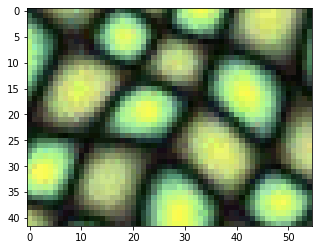

template :


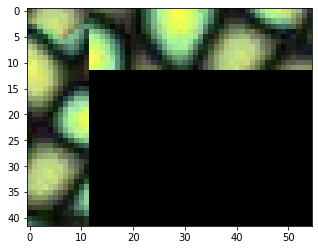

pixelwise ssd for vertical overlap : 


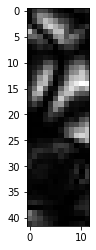

vertical mask :


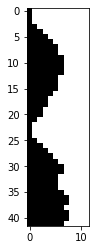

pixelwise ssd for horizontal overlap : 


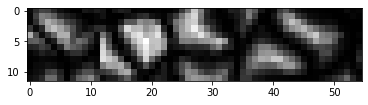

horizontal mask :


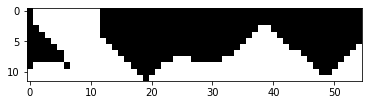

final mask :


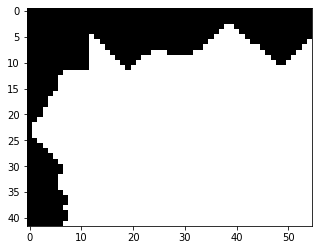

output :


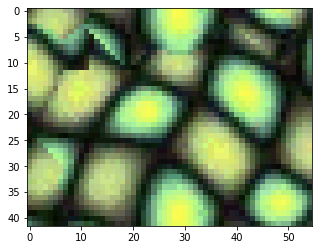

sample_chosen :


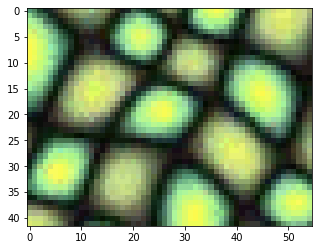

template :


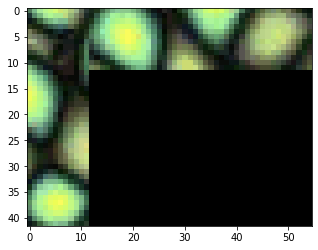

pixelwise ssd for vertical overlap : 


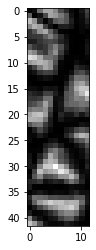

vertical mask :


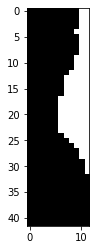

pixelwise ssd for horizontal overlap : 


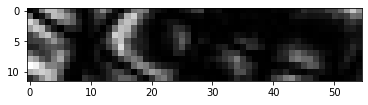

horizontal mask :


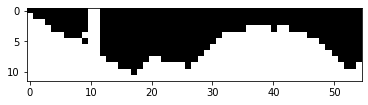

final mask :


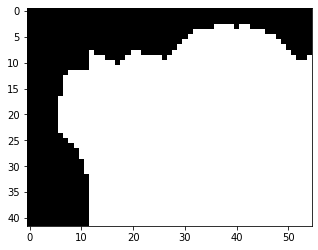

output :


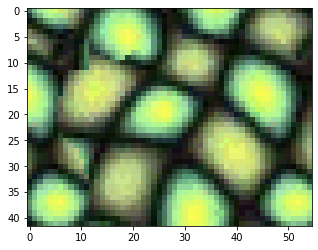

sample_chosen :


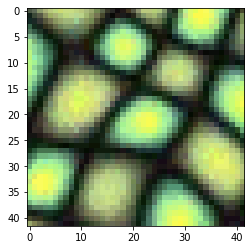

template :


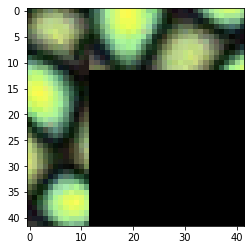

pixelwise ssd for vertical overlap : 


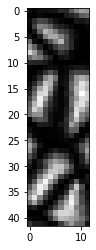

vertical mask :


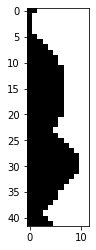

pixelwise ssd for horizontal overlap : 


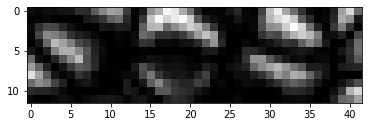

horizontal mask :


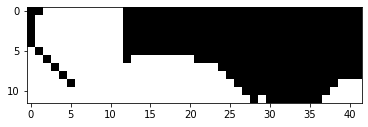

final mask :


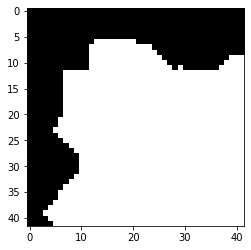

output :


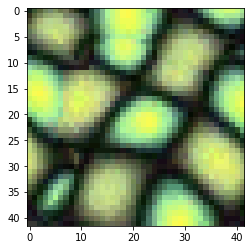

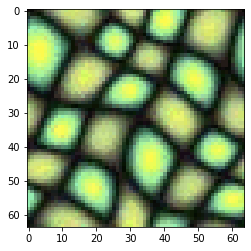


Minimum cut boundary Sampled Texture image shape :  (300, 300, 3)
Minimum cut boundary Sampled Texture image : 


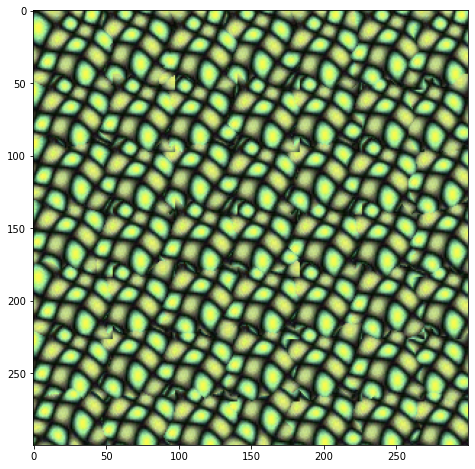

In [ ]:
sample_img_fn = datadir+'samples/test.png'

sample_img = cv2.cvtColor(cv2.imread(sample_img_fn), cv2.COLOR_BGR2RGB)
print("texture shape : ", sample_img.shape)
print("texture image : ")
plt.imshow(sample_img)
plt.show()
print()

out_size = 300
patch_size = 55
overlap = 12
tol = 1
res = quilt_cut(sample_img, out_size, patch_size, overlap, tol)
plt.imshow(sample_img)
plt.show()
print()

if res is not None:
  res = res/255.0
  print("Minimum cut boundary Sampled Texture image shape : ", res.shape)
  print("Minimum cut boundary Sampled Texture image : ")
  plt.figure(figsize=(8,8))
  plt.imshow(res)

texture shape :  (64, 64, 3)
texture image : 


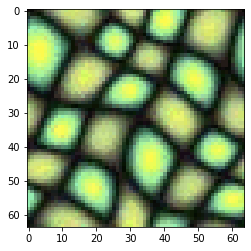


Minimum cut boundary Sampled Texture image shape :  (300, 300, 3)
Minimum cut boundary Sampled Texture image : 


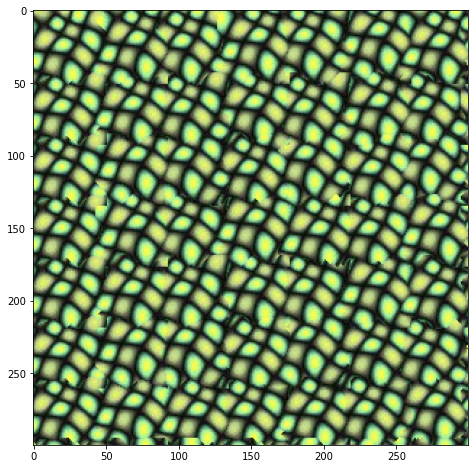

In [ ]:
sample_img_fn = datadir+'samples/test.png'

sample_img = cv2.cvtColor(cv2.imread(sample_img_fn), cv2.COLOR_BGR2RGB)
print("texture shape : ", sample_img.shape)
print("texture image : ")

out_size = 300
patch_size = 51
overlap = 9
tol = 1
res = quilt_cut(sample_img, out_size, patch_size, overlap, tol)
plt.imshow(sample_img)
plt.show()
print()

if res is not None:
  res = res/255.0
  print("Minimum cut boundary Sampled Texture image shape : ", res.shape)
  print("Minimum cut boundary Sampled Texture image : ")
  plt.figure(figsize=(8,8))
  plt.imshow(res)

From the above results, we can observe that the best SSD method performs much better than the random method for all cases, and the minimum cut method is in turn better than the best SSD.

### part IV: Texture Transfer


Texture Transfer is based on the quilt implementation for creating a texture sample that is
guided by a pair of sample/target correspondence images. Here, instead of synthesizing new
textures, a target image is used as a template for the shape of the output, but a new texture is
applied to it. The main difference between this function and quilt function is that there is an
additional cost term based on the difference between the sampled source patch and the target
patch at the location to be filled. I assigned weights to these two cost terms by using a term,
alpha, which can be fed as a parameter in the function call.

Parameters- It requires an input texture, a guiding image that will be used to generate the final
image by applying the texture patches from texture image to this one. It also has patch size and
tolerance as earlier. Alpha is a new parameter added and it will help determine the weight of
each cost term as mentioned above.

In [ ]:
from skimage import exposure
from scipy.signal import convolve

def compute_correspondence_map(image, method):

  if method == 'intensity_equalizer':
    return exposure.equalize_hist(rgb2gray(image))

  if method == 'gaussian_blurr':
    image_blur = gaussian(image,  sigma=1, multichannel =True)
    return image_blur

def ssd_guiding_patch(sample, patch):

  cost = np.zeros((sample.shape))
  patch_size_m = patch.shape[0]
  patch_size_n = patch.shape[1]
  M, N = sample.shape
  for i in range(int(patch_size_m/2), M-int(patch_size_m/2)):
    for j in range(int(patch_size_n/2), N-int(patch_size_n/2)):

      topx = i- int(patch_size_m/2)
      topy = j- int(patch_size_n/2)
      input = sample[topx:topx+patch_size_m, topy:topy+patch_size_n]

      # print("i,j, patch_size_m, patch_size_n", i,j,patch_size_m, patch_size_n)
      cc = np.sum((input - patch)**2)
      cost[i,j] = cc
      # arr.append({"cost": cost[i][j], "i":i, "j":j})

  return cost

  # final_cost = np.zeros((M,N))
  # for i in range(M):
  #   for j in range(N):
  #     final_cost[i,j]  = cost[i,j,0] + cost[i,j,1] + cost[i,j,2]

  # return final_cost/3

In [ ]:
from skimage.color import rgb2gray
from skimage.filters import gaussian
import math

In [ ]:
from IPython.lib.security import passwd_check
from skimage.color import rgb2gray
def texture_transfer(texture, guidance_im, patch_size, overlap, tol, corr_method, alpha=0.1, iteration_number=0, old_res=None):
  """
  Samples square patches of size patchsize from sample using seam finding in order to create an output image of size outsize.
  Feel free to add function parameters
  :param sample: numpy.ndarray
  :param out_size: int
  :param patch_size: int
  :param overlap: int
  :param tol: float
  :return: numpy.ndarray
  """
  # get corrspondance image for texture
  # get correspondance image for guidance image
  corrTexture = rgb2gray(texture)
  corrGuiding  = rgb2gray(guidance_im)
  corrTexture = compute_correspondence_map(corrTexture,corr_method)
  corrGuiding = compute_correspondence_map(corrGuiding,corr_method)


  # plt.imshow(texture)
  # plt.show()
  # plt.imshow(guidance_im)
  # plt.show()
  # plt.imshow(corrTexture)
  # plt.show()
  # plt.imshow(corrGuiding)
  # plt.show()


  # initialize resulting output image
  # out = np.zeros_like(guidance_im) if iteration_number==0 else old_res
  out = np.zeros((guidance_im.shape[0], guidance_im.shape[1], 3)) if iteration_number==0 else old_res

  for i in range(0, out.shape[0], patch_size - overlap):
    for j in range(0, out.shape[1], patch_size - overlap):

      # handle mask size for end patch(index reaches more than out_size)
      di = min(i + patch_size, out.shape[0]) - i
      dj = min(j + patch_size, out.shape[1]) - j

      if (i == 0 and j == 0):

        # find cost image for guiding image
        patch = np.zeros((di, dj))
        patch[0:di, 0:dj] = corrGuiding[i:i+di,j:j+dj]
        cost_guiding_image = ssd_guiding_patch(corrTexture, patch)

        #find total cost
        # final_cost = (1 - alpha) * cost_guiding_image
        final_cost =  cost_guiding_image

        # find center pixel of sample patch with min_cost
        p, q = choose_sample(final_cost, tol, di, dj, patch_size)
        top_x = p - int((di+1)/2)
        top_y = q - int((dj+1)/2)

        out[i:i+di,j:j+dj] = texture[top_x:top_x+di, top_y:top_y+dj]

      else:
        # create mask
        mask=np.zeros((di, dj))
        if(i> 0):
          mask[0:overlap,:]= 1
        if(j> 0):
          mask[:,0:overlap]= 1

        # create template and input image
        template=np.zeros((di, dj,3))
        template[0:di, 0:dj] = out[i:i+di, j:j+dj]
        input_image = texture/255.0

        # find cost image for overlap
        cost_initial_patch = ssd_patch(template, mask, input_image)

        # find cost image for guiding image
        patch = np.zeros((di, dj))
        patch[0:di, 0:dj] = corrGuiding[i:i+di,j:j+dj]
        # print("patch shape ", patch.shape)
        cost_guiding_image = ssd_guiding_patch(corrTexture, patch)
        # print("cost_guiding_image shape at i,j ", cost_guiding_image.shape, i , j, di, dj)


        prev_error = 0
        if iteration_number > 0:
          patch = texture[i:i+di, j:j+dj]
          prev_error = patch[overlap:, overlap:] - out[i+overlap:di+i, j+overlap:dj+j]
          prev_error = np.sum(prev_error**2)


        #find total cost
        final_cost = alpha * (cost_initial_patch + prev_error) + (1 - alpha) * cost_guiding_image

        # find center pixel of sample patch with min_cost
        p, q = choose_sample(final_cost, tol, di, dj, patch_size)
        top_x = p - int((di+1)/2)
        top_y = q - int((dj+1)/2)

        # sample_chosen = corrTexture[top_x:top_x+di, top_y:top_y+dj]
        # sample_chosen = np.repeat(sample_chosen[:, :, np.newaxis], 3, axis=2)
        # template = out[i:i + di, j:j + dj]

        sample_chosen = texture[top_x:top_x+di, top_y:top_y+dj]
        template = out[i:i + di, j:j + dj]

        # print("template ", template.shape)
        # plt.imshow(template)
        # plt.show()

        # print("sample_chosen ", sample_chosen.shape)
        # plt.imshow(sample_chosen)
        # plt.show()

        final_mask = np.zeros(template.shape)
        if j != 0:
          diff_sqr = (template[:, :overlap, :] - sample_chosen[:, :overlap, :])**2
          error_vertical = cut(np.sum(diff_sqr, axis=2).T).T
          error_vertical = np.repeat(error_vertical[:, :, np.newaxis], 3, axis=2)
          final_mask[:, :overlap] += error_vertical
          # print("mask vertical ", final_mask.shape)
          # plt.imshow(final_mask)
          # plt.show()
        if i != 0:
          diff_sqr = (template[:overlap, :, :] - sample_chosen[:overlap, :, :])**2
          error_horizontal = cut(np.sum(diff_sqr, axis=2))
          error_horizontal = np.repeat(error_horizontal[:, :, np.newaxis], 3, axis=2)
          final_mask[:overlap, :] += error_horizontal

          # print("mask horizontal ", final_mask.shape)
          # plt.imshow(final_mask)
          # plt.show()

        if(i>0 and j==0):
          final_mask[overlap:, :] = 1
        elif(j>0 and i==0):
          final_mask[:, overlap:] = 1
        elif(i>0 and j>0):
          final_mask[:overlap, :overlap] = 0
          final_mask[overlap:, overlap:] = 1

        # print("final_mask4", final_mask.shape)
        # plt.imshow(final_mask)
        # plt.show()
        out[i:i + di, j:j + dj] = final_mask * sample_chosen + (1-final_mask) * template
        # print("output area")
        # plt.imshow(out[i:i + di, j:j + dj]/255.0)
        # plt.show()
        # print(" out ")
        # plt.imshow(out/255.0)
        # plt.show()

  return out

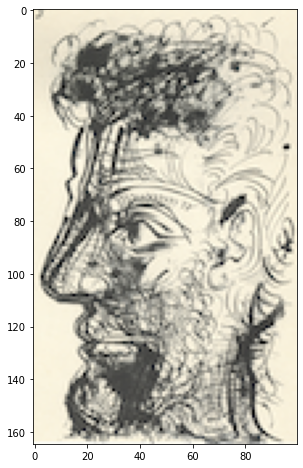

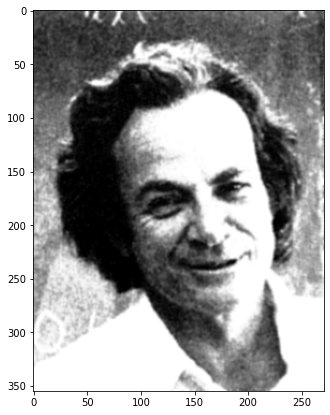

In [ ]:
sample_img_fn = datadir+'samples/sketch1.tiff'
guidance_img_fn = datadir+'samples/feynman.tiff'

texture_img = cv2.cvtColor(cv2.imread(sample_img_fn), cv2.COLOR_BGR2RGB)
guidance_img = cv2.cvtColor(cv2.imread(guidance_img_fn), cv2.COLOR_BGR2RGB)

plt.figure(figsize=(8,8))
plt.imshow(texture_img)
plt.show()

plt.figure(figsize=(7,7))
plt.imshow(guidance_img)
plt.show()

(165, 100, 3)
(355, 271, 3)


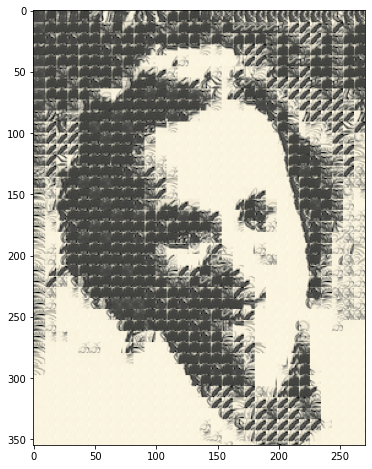

In [ ]:
# load/process appropriate input texture and guidance images
sample_img_fn = datadir+'samples/sketch1.tiff'
guidance_img_fn = datadir+'samples/feynman.tiff'

texture_img = cv2.cvtColor(cv2.imread(sample_img_fn), cv2.COLOR_BGR2RGB)
guidance_img = cv2.cvtColor(cv2.imread(guidance_img_fn), cv2.COLOR_BGR2RGB)
print(texture_img.shape)
print(guidance_img.shape)

patch_size = 10
overlap = 1
tol = 1
alpha = 0.01
#texture, guidance_im, patch_size, overlap, tol, corr_method, alpha=0.1, iteration_number=1, old_res=None
res = texture_transfer(texture_img, guidance_img, patch_size, overlap, tol, "gaussian_blurr" , alpha)

# print(res)
plt.figure(figsize=(8,8))
plt.imshow(res/255)
plt.show()

(239, 200, 3)
(208, 200, 3)


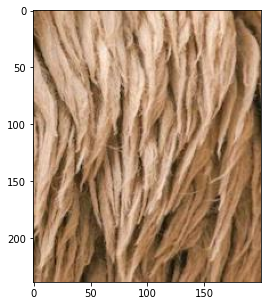

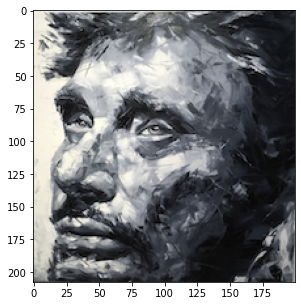

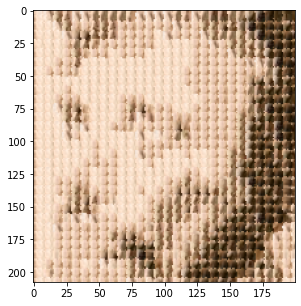

In [ ]:
# load/process appropriate input texture and guidance images
sample_img_fn = datadir+'samples/texture3.jpeg'
guidance_img_fn = datadir+'samples/man.png'


texture_img = cv2.cvtColor(cv2.imread(sample_img_fn), cv2.COLOR_BGR2RGB)
guidance_img = cv2.cvtColor(cv2.imread(guidance_img_fn), cv2.COLOR_BGR2RGB)
print(texture_img.shape)
print(guidance_img.shape)
plt.figure(figsize=(5,5))
plt.imshow(texture_img)
plt.show()
plt.figure(figsize=(5,5))
plt.imshow(guidance_img)
plt.show()

patch_size = 9
overlap = 2
tol = 1
alpha = 0.01
#texture, guidance_im, patch_size, overlap, tol, corr_method, alpha=0.1, iteration_number=1, old_res=None
res = texture_transfer(texture_img, guidance_img, patch_size, overlap, tol, "gaussian_blurr" , alpha)

plt.figure(figsize=(5,5))
plt.imshow(res/255)
plt.show()

(203, 150, 3)
(300, 200, 3)
(203, 150, 3)
(203, 150)
(300, 200, 3)
(300, 200)


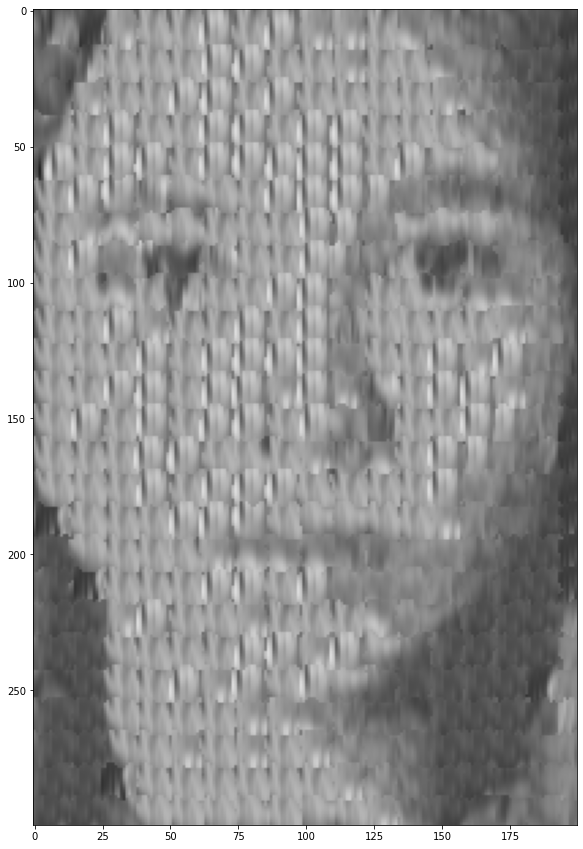

In [ ]:
# load/process appropriate input texture and guidance images
sample_img_fn = datadir+'samples/texture1.jpeg'
guidance_img_fn = datadir+'samples/lady2.jpeg'

texture_img = cv2.cvtColor(cv2.imread(sample_img_fn), cv2.COLOR_BGR2RGB)
guidance_img = cv2.cvtColor(cv2.imread(guidance_img_fn), cv2.COLOR_BGR2RGB)
print(texture_img.shape)
print(guidance_img.shape)


patch_size = 15
overlap = 3
tol = 5
alpha = 0.1
#texture, guidance_im, patch_size, overlap, tol, corr_method, alpha=0.1, iteration_number=1, old_res=None
res = texture_transfer(texture_img, guidance_img, patch_size, overlap, tol, "gaussian_blurr" , alpha)

plt.figure(figsize=(8,8))
plt.imshow(res)
plt.show()

#### Iterative Texture Transfer

In such cases, we iterate over the synthesized image several times, reducing the block size with
each iteration. It starts out using large blocks to roughly assign where everything will go and
then uses smaller blocks to make sure the different textures fit well together.

In [ ]:
def transfer_iterative(texture, target, patch_size, overlap, tol, n, corr_method='gaussian_blurr'):
  output = texture_transfer(texture, target, patch_size, overlap, tol, corr_method, alpha=0.1, iteration_number=0, old_res=None)
  print("Output at step=", 1,  " for patch_size= ",patch_size, " and alpha=",0.1)
  plt.imshow(output/255)
  plt.show()

  for i in range(1, n):
    alpha = 0.1 + 0.8 * i / (n - 1)
    patch_size = patch_size * 2**i // 3**i
    output = texture_transfer(texture, target, patch_size, overlap, tol, corr_method, alpha=alpha, iteration_number=i, old_res=output)
    print("Output at step=", i+1,  " for patch_size= ",patch_size, " and alpha=",alpha)
    plt.imshow(output/255)
    plt.show()
  return output

(165, 100, 3)
(355, 271, 3)
Output at step= 1  for patch_size=  7  and alpha= 0.1


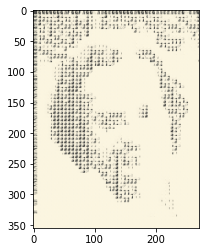

Output at step= 2  for patch_size=  5  and alpha= 0.1


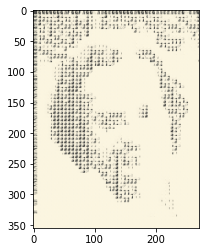

In [ ]:
# load/process appropriate input texture and guidance images
sample_img_fn = datadir+'samples/sketch1.tiff'
guidance_img_fn = datadir+'samples/feynman.tiff'

texture_img = cv2.cvtColor(cv2.imread(sample_img_fn), cv2.COLOR_BGR2RGB)
guidance_img = cv2.cvtColor(cv2.imread(guidance_img_fn), cv2.COLOR_BGR2RGB)
print(texture_img.shape)
print(guidance_img.shape)


patch_size = 7
overlap = 1
tol = 1
res = transfer_iterative(texture_img, guidance_img, patch_size, overlap, tol, 2, "gaussian_blurr")
